In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import datetime
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.metrics import mean_absolute_error


from prophet import Prophet
from xgboost import XGBRegressor

In [2]:
import pandas as pd
import numpy as np


In [3]:
df1=pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2014.csv')

In [4]:
df2 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2015.csv')

In [5]:
df3 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2016.csv')

In [6]:
df4 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2017.csv')

In [7]:
df5 =  pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2018.csv')

In [8]:
df6 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2019.csv')

In [9]:
df7 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2020.csv')

In [10]:
df8 =pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2021.csv')

In [11]:
df9 = pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2022.csv')

In [12]:
df55= pd.read_csv('C:/Users/halee/Desktop/bWeatherEvents_Jan2016-Dec2022.csv')

In [13]:
import pandas as pd

# Assuming you have a DataFrame named 'df' with columns 'date', 'fips_code', 'county', and 'Highest_Outage'

# Convert the 'date' column to datetime
df1['run_start_time'] = pd.to_datetime(df1['run_start_time'])

# Set 'date' as the index
df1.set_index('run_start_time', inplace=True)




In [14]:
df1.head()

,fips_code,county,state,sum
run_start_time,,,,
2014-11-01 04:00:00,1037,Coosa,Alabama,12
2014-11-01 04:00:00,1051,Elmore,Alabama,7
2014-11-01 04:00:00,1109,Pike,Alabama,1
2014-11-01 04:00:00,1121,Talladega,Alabama,31
2014-11-01 04:00:00,4017,Navajo,Arizona,1


In [15]:
df1

,fips_code,county,state,sum
run_start_time,,,,
2014-11-01 04:00:00,1037,Coosa,Alabama,12
2014-11-01 04:00:00,1051,Elmore,Alabama,7
2014-11-01 04:00:00,1109,Pike,Alabama,1
2014-11-01 04:00:00,1121,Talladega,Alabama,31
2014-11-01 04:00:00,4017,Navajo,Arizona,1
...,...,...,...,...
2014-12-31 00:00:00,55029,Door,Wisconsin,1
2014-12-31 00:00:00,55079,Milwaukee,Wisconsin,1
2014-12-31 00:00:00,55093,Pierce,Wisconsin,6


In [16]:
df1

,fips_code,county,state,sum
run_start_time,,,,
2014-11-01 04:00:00,1037,Coosa,Alabama,12
2014-11-01 04:00:00,1051,Elmore,Alabama,7
2014-11-01 04:00:00,1109,Pike,Alabama,1
2014-11-01 04:00:00,1121,Talladega,Alabama,31
2014-11-01 04:00:00,4017,Navajo,Arizona,1
...,...,...,...,...
2014-12-31 00:00:00,55029,Door,Wisconsin,1
2014-12-31 00:00:00,55079,Milwaukee,Wisconsin,1
2014-12-31 00:00:00,55093,Pierce,Wisconsin,6


In [17]:
df1['date'] = df1.index.date

In [18]:
df1

,fips_code,county,state,sum,date
run_start_time,,,,,
2014-11-01 04:00:00,1037,Coosa,Alabama,12,2014-11-01
2014-11-01 04:00:00,1051,Elmore,Alabama,7,2014-11-01
2014-11-01 04:00:00,1109,Pike,Alabama,1,2014-11-01
2014-11-01 04:00:00,1121,Talladega,Alabama,31,2014-11-01
2014-11-01 04:00:00,4017,Navajo,Arizona,1,2014-11-01
...,...,...,...,...,...
2014-12-31 00:00:00,55029,Door,Wisconsin,1,2014-12-31
2014-12-31 00:00:00,55079,Milwaukee,Wisconsin,1,2014-12-31
2014-12-31 00:00:00,55093,Pierce,Wisconsin,6,2014-12-31


In [19]:
# Group by 'run_start_time', 'county', 'state', and 'fips_code' and calculate max outage count
grouped_data1 = df1.groupby(['date', 'county', 'state', 'fips_code']).max()['sum'].reset_index()

In [20]:
grouped_data1

,date,county,state,fips_code,sum
0,2014-11-01,Abbeville,South Carolina,45001,70
1,2014-11-01,Accomack,Virginia,51001,2
2,2014-11-01,Adams,Colorado,8001,1
3,2014-11-01,Adams,Illinois,17001,1
4,2014-11-01,Adams,Indiana,18001,68
...,...,...,...,...,...
70271,2014-12-31,Woodruff,Arkansas,5147,1
70272,2014-12-31,Worcester,Massachusetts,25027,1
70273,2014-12-31,Wright,Minnesota,27171,5
70274,2014-12-31,Yolo,California,6113,52


In [21]:
df2.head()

,fips_code,county,state,sum,run_start_time
0,1021,Chilton,Alabama,3,2015-01-01 00:00:00
1,5003,Ashley,Arkansas,3,2015-01-01 00:00:00
2,5023,Cleburne,Arkansas,1,2015-01-01 00:00:00
3,5085,Lonoke,Arkansas,2,2015-01-01 00:00:00
4,5107,Phillips,Arkansas,3,2015-01-01 00:00:00


In [22]:

# Convert the 'date' column to datetime
df2['run_start_time'] = pd.to_datetime(df2['run_start_time'])

# Set 'date' as the index
df2.set_index('run_start_time', inplace=True)

In [23]:
df2.head()

,fips_code,county,state,sum
run_start_time,,,,
2015-01-01,1021,Chilton,Alabama,3
2015-01-01,5003,Ashley,Arkansas,3
2015-01-01,5023,Cleburne,Arkansas,1
2015-01-01,5085,Lonoke,Arkansas,2
2015-01-01,5107,Phillips,Arkansas,3


In [26]:
grouped_data2

NameError: name 'grouped_data2' is not defined

In [27]:
df2['date'] = df2.index.date

df2.head()

In [28]:
df2.head()

,fips_code,county,state,sum,date
run_start_time,,,,,
2015-01-01,1021,Chilton,Alabama,3,2015-01-01
2015-01-01,5003,Ashley,Arkansas,3,2015-01-01
2015-01-01,5023,Cleburne,Arkansas,1,2015-01-01
2015-01-01,5085,Lonoke,Arkansas,2,2015-01-01
2015-01-01,5107,Phillips,Arkansas,3,2015-01-01


In [29]:
# Group by 'run_start_time', 'county', 'state', and 'fips_code' and calculate max outage count
grouped_data2 = df2.groupby(['date', 'county', 'state', 'fips_code']).max()['sum'].reset_index()

In [30]:
grouped_data2.head()

,date,county,state,fips_code,sum
0,2015-01-01,Accomack,Virginia,51001,3
1,2015-01-01,Adair,Iowa,19001,524
2,2015-01-01,Adams,Colorado,8001,8
3,2015-01-01,Adams,Indiana,18001,1
4,2015-01-01,Adams,Mississippi,28001,3


In [31]:
df3.head()

,fips_code,county,state,sum,run_start_time
0,2122,Kenai Peninsula,Alaska,657,2016-01-01 00:00:00
1,5003,Ashley,Arkansas,7,2016-01-01 00:00:00
2,5029,Conway,Arkansas,2,2016-01-01 00:00:00
3,5069,Jefferson,Arkansas,41,2016-01-01 00:00:00
4,5081,Little River,Arkansas,61,2016-01-01 00:00:00


In [32]:

# Convert the 'date' column to datetime
df3['run_start_time'] = pd.to_datetime(df3['run_start_time'])

# Set 'date' as the index
df3.set_index('run_start_time', inplace=True)

In [33]:
df3.head()

,fips_code,county,state,sum
run_start_time,,,,
2016-01-01,2122,Kenai Peninsula,Alaska,657
2016-01-01,5003,Ashley,Arkansas,7
2016-01-01,5029,Conway,Arkansas,2
2016-01-01,5069,Jefferson,Arkansas,41
2016-01-01,5081,Little River,Arkansas,61


In [34]:
df3['date'] = df3.index.date

In [35]:
# Group by 'run_start_time', 'county', 'state', and 'fips_code' and calculate max outage count
grouped_data3 = df3.groupby(['date', 'county', 'state', 'fips_code']).max()['sum'].reset_index()

In [36]:
grouped_data3

,date,county,state,fips_code,sum
0,2016-01-01,Acadia,Louisiana,22001,10
1,2016-01-01,Accomack,Virginia,51001,4
2,2016-01-01,Adams,Colorado,8001,196
3,2016-01-01,Adams,Illinois,17001,1
4,2016-01-01,Adams,Indiana,18001,1
...,...,...,...,...,...
496888,2016-12-31,Wilson,Tennessee,47189,1
496889,2016-12-31,Windham,Vermont,50025,1
496890,2016-12-31,Windsor,Vermont,50027,24
496891,2016-12-31,Worcester,Massachusetts,25027,1


In [37]:
df4.head()

,fips_code,county,state,sum,run_start_time
0,1003,Baldwin,Alabama,1.0,2017-01-01 00:00:00
1,2090,Fairbanks North Star,Alaska,245.0,2017-01-01 00:00:00
2,2122,Kenai Peninsula,Alaska,5.0,2017-01-01 00:00:00
3,2290,Yukon-Koyukuk,Alaska,2.0,2017-01-01 00:00:00
4,5035,Crittenden,Arkansas,1.0,2017-01-01 00:00:00


In [38]:
df_finalc=pd.concat([daily_sum_by_county1,daily_sum_by_county2,daily_sum_by_county3,daily_sum_by_county4,daily_sum_by_county5,daily_sum_by_county6,daily_sum_by_county7,daily_sum_by_county8,daily_sum_by_county9])

NameError: name 'daily_sum_by_county1' is not defined

In [39]:
# Convert run_start_time to datetime format
df4['run_start_time'] = pd.to_datetime(df4['run_start_time'])

# Set the run_start_time column as the DataFrame index
df4.set_index('run_start_time', inplace=True)

In [40]:
df4

,fips_code,county,state,sum
run_start_time,,,,
2017-01-01,1003,Baldwin,Alabama,1.0
2017-01-01,2090,Fairbanks North Star,Alaska,245.0
2017-01-01,2122,Kenai Peninsula,Alaska,5.0
2017-01-01,2290,Yukon-Koyukuk,Alaska,2.0
2017-01-01,5035,Crittenden,Arkansas,1.0
...,...,...,...,...
2017-12-31,55013,Burnett,Wisconsin,3.0
2017-12-31,55031,Douglas,Wisconsin,1.0
2017-12-31,55079,Milwaukee,Wisconsin,1.0


In [41]:
df4['date'] = df4.index.date

In [42]:
# Group by 'run_start_time', 'county', 'state', and 'fips_code' and calculate max outage count
grouped_data4 = df4.groupby(['date', 'county','state' , 'fips_code']).max()['sum'].reset_index()

In [43]:
grouped_data4

,date,county,state,fips_code,sum
0,2017-01-01,Acadia,Louisiana,22001,27.0
1,2017-01-01,Adams,Illinois,17001,1.0
2,2017-01-01,Adams,Mississippi,28001,62.0
3,2017-01-01,Adams,Ohio,39001,137.0
4,2017-01-01,Aiken,South Carolina,45003,15.0
...,...,...,...,...,...
552247,2017-12-31,Williamson,Illinois,17199,2.0
552248,2017-12-31,Woodbury,Iowa,19193,4.0
552249,2017-12-31,Yakima,Washington,53077,1.0
552250,2017-12-31,York,Pennsylvania,42133,4.0


In [44]:
df5.head()

,fips_code,county,state,sum,run_start_time
0,1015,Calhoun,Alabama,1.0,2018-01-01 00:00:00
1,1029,Cleburne,Alabama,5.0,2018-01-01 00:00:00
2,1057,Fayette,Alabama,16.0,2018-01-01 00:00:00
3,1073,Jefferson,Alabama,6.0,2018-01-01 00:00:00
4,1097,Mobile,Alabama,2.0,2018-01-01 00:00:00


In [45]:
# Convert run_start_time to datetime format
df5['run_start_time'] = pd.to_datetime(df5['run_start_time'])

# Set the run_start_time column as the DataFrame index
df5.set_index('run_start_time', inplace=True)

In [46]:
df5['date'] = df5.index.date

In [47]:
# Group by 'run_start_time', 'county', 'state', and 'fips_code' and calculate max outage count
grouped_data5 = df5.groupby(['date', 'county', 'state', 'fips_code']).max()['sum'].reset_index()

In [48]:
grouped_data5

,date,county,state,fips_code,sum
0,2018-01-01,Acadia,Louisiana,22001,32.0
1,2018-01-01,Ada,Idaho,16001,44.0
2,2018-01-01,Adair,Iowa,19001,11.0
3,2018-01-01,Adair,Missouri,29001,8.0
4,2018-01-01,Adair,Oklahoma,40001,9.0
...,...,...,...,...,...
729382,2018-12-31,Woodson,Kansas,20207,NaN
729383,2018-12-31,Worth,Missouri,29227,NaN
729384,2018-12-31,Wyandotte,Kansas,20209,NaN
729385,2018-12-31,Yavapai,Arizona,4025,394.0


In [49]:
df6.head()

,fips_code,county,state,sum,run_start_time
0,1001,Autauga,Alabama,10.0,2019-01-01 00:00:00
1,1003,Baldwin,Alabama,36.0,2019-01-01 00:00:00
2,1007,Bibb,Alabama,93.0,2019-01-01 00:00:00
3,1009,Blount,Alabama,4.0,2019-01-01 00:00:00
4,1015,Calhoun,Alabama,457.0,2019-01-01 00:00:00


In [50]:
# Convert run_start_time to datetime format
df6['run_start_time'] = pd.to_datetime(df6['run_start_time'])

# Set the run_start_time column as the DataFrame index
df6.set_index('run_start_time', inplace=True)

In [51]:
df6['date'] = df6.index.date

In [52]:
# Group by 'run_start_time', 'county', 'state', and 'fips_code' and calculate max outage count
grouped_data6 = df6.groupby(['date', 'county', 'state', 'fips_code']).max()['sum'].reset_index()

In [53]:
grouped_data6

,date,county,state,fips_code,sum
0,2019-01-01,Acadia,Louisiana,22001,2.0
1,2019-01-01,Accomack,Virginia,51001,123.0
2,2019-01-01,Ada,Idaho,16001,3342.0
3,2019-01-01,Adams,Colorado,8001,31.0
4,2019-01-01,Adams,Illinois,17001,1.0
...,...,...,...,...,...
794688,2019-12-31,Yolo,California,6113,1.0
794689,2019-12-31,York,Pennsylvania,42133,4.0
794690,2019-12-31,York,South Carolina,45091,NaN
794691,2019-12-31,York,Virginia,51199,1.0


In [54]:
df7.head()

,fips_code,county,state,sum,run_start_time
0,1003,Baldwin,Alabama,NaN,2020-01-01 00:00:00
1,1047,Dallas,Alabama,4.0,2020-01-01 00:00:00
2,1055,Etowah,Alabama,4.0,2020-01-01 00:00:00
3,1073,Jefferson,Alabama,4.0,2020-01-01 00:00:00
4,1097,Mobile,Alabama,4.0,2020-01-01 00:00:00


In [55]:
# Convert run_start_time to datetime format
df7['run_start_time'] = pd.to_datetime(df7['run_start_time'])

# Set the run_start_time column as the DataFrame index
df7.set_index('run_start_time', inplace=True)

In [56]:
df7['date'] = df7.index.date

In [57]:
# Group by 'run_start_time', 'county', 'state', and 'fips_code' and calculate max outage count
grouped_data7 = df7.groupby(['date', 'county', 'state', 'fips_code']).max()['sum'].reset_index()

In [58]:
grouped_data7

,date,county,state,fips_code,sum
0,2020-01-01,Abbeville,South Carolina,45001,NaN
1,2020-01-01,Acadia,Louisiana,22001,4.0
2,2020-01-01,Accomack,Virginia,51001,1.0
3,2020-01-01,Ada,Idaho,16001,31.0
4,2020-01-01,Adams,Colorado,8001,476.0
...,...,...,...,...,...
864120,2020-12-31,Wythe,Virginia,51197,4.0
864121,2020-12-31,Yalobusha,Mississippi,28161,4.0
864122,2020-12-31,Yellow Medicine,Minnesota,27173,NaN
864123,2020-12-31,Yolo,California,6113,1.0


In [59]:
df8.head()

,fips_code,county,state,sum,run_start_time
0,1003,Baldwin,Alabama,6.0,2021-01-01 00:00:00
1,1009,Blount,Alabama,4.0,2021-01-01 00:00:00
2,1017,Chambers,Alabama,4.0,2021-01-01 00:00:00
3,1031,Coffee,Alabama,1.0,2021-01-01 00:00:00
4,1051,Elmore,Alabama,4.0,2021-01-01 00:00:00


In [60]:
# Convert run_start_time to datetime format
df8['run_start_time'] = pd.to_datetime(df8['run_start_time'])

# Set the run_start_time column as the DataFrame index
df8.set_index('run_start_time', inplace=True)

In [61]:
df8['date'] = df8.index.date

In [62]:
# Group by 'run_start_time', 'county', 'state', and 'fips_code' and calculate max outage count
grouped_data8 = df8.groupby(['date', 'county', 'state', 'fips_code']).max()['sum'].reset_index()

In [63]:
grouped_data8

,date,county,state,fips_code,sum
0,2021-01-01,Acadia,Louisiana,22001,655.0
1,2021-01-01,Accomack,Virginia,51001,563.0
2,2021-01-01,Ada,Idaho,16001,61.0
3,2021-01-01,Adair,Kentucky,21001,4.0
4,2021-01-01,Adair,Missouri,29001,2.0
...,...,...,...,...,...
828124,2021-12-31,Wythe,Virginia,51197,4.0
828125,2021-12-31,Yakima,Washington,53077,1.0
828126,2021-12-31,Yolo,California,6113,1.0
828127,2021-12-31,Yuba,California,6115,246.0


In [64]:
df9.head()

,fips_code,county,state,sum,run_start_time
0,1005,Barbour,Alabama,4.0,2022-01-01 00:00:00
1,1009,Blount,Alabama,160.0,2022-01-01 00:00:00
2,1051,Elmore,Alabama,3.0,2022-01-01 00:00:00
3,1055,Etowah,Alabama,4.0,2022-01-01 00:00:00
4,1057,Fayette,Alabama,4.0,2022-01-01 00:00:00


In [65]:
# Convert run_start_time to datetime format
df9['run_start_time'] = pd.to_datetime(df9['run_start_time'])

# Set the run_start_time column as the DataFrame index
df9.set_index('run_start_time', inplace=True)

In [66]:
df9['date'] = df9.index.date

In [67]:
# Group by 'run_start_time', 'county', 'state', and 'fips_code' and calculate max outage count
grouped_data9 = df9.groupby(['date', 'county', 'state', 'fips_code']).max()['sum'].reset_index()

In [68]:
grouped_data9

,date,county,state,fips_code,sum
0,2022-01-01,Acadia,Louisiana,22001,1887.0
1,2022-01-01,Accomack,Virginia,51001,34.0
2,2022-01-01,Ada,Idaho,16001,89.0
3,2022-01-01,Adair,Kentucky,21001,4.0
4,2022-01-01,Adair,Oklahoma,40001,130.0
...,...,...,...,...,...
723923,2022-11-12,Young,Texas,48503,34.0
723924,2022-11-12,Yuba,California,6115,1.0
723925,2022-11-12,Zapata,Texas,48505,8.0
723926,2022-11-12,Zavala,Texas,48507,20.0


In [69]:
df_final=pd.concat([grouped_data1,grouped_data2,grouped_data3,grouped_data4,grouped_data5,grouped_data6,grouped_data7,grouped_data8,grouped_data9])

In [70]:
df_final

,date,county,state,fips_code,sum
0,2014-11-01,Abbeville,South Carolina,45001,70.0
1,2014-11-01,Accomack,Virginia,51001,2.0
2,2014-11-01,Adams,Colorado,8001,1.0
3,2014-11-01,Adams,Illinois,17001,1.0
4,2014-11-01,Adams,Indiana,18001,68.0
...,...,...,...,...,...
723923,2022-11-12,Young,Texas,48503,34.0
723924,2022-11-12,Yuba,California,6115,1.0
723925,2022-11-12,Zapata,Texas,48505,8.0
723926,2022-11-12,Zavala,Texas,48507,20.0


In [107]:
df_final=df_final.reset_index()

In [108]:
df_final

,index,date,county,state,fips_code,sum
0,0,2014-11-01,Abbeville,South Carolina,45001,70.0
1,1,2014-11-01,Accomack,Virginia,51001,2.0
2,2,2014-11-01,Adams,Colorado,8001,1.0
3,3,2014-11-01,Adams,Illinois,17001,1.0
4,4,2014-11-01,Adams,Indiana,18001,68.0
...,...,...,...,...,...,...
5545206,723923,2022-11-12,Young,Texas,48503,34.0
5545207,723924,2022-11-12,Yuba,California,6115,1.0
5545208,723925,2022-11-12,Zapata,Texas,48505,8.0
5545209,723926,2022-11-12,Zavala,Texas,48507,20.0


In [71]:
# Convert run_start_time to datetime format
df55['StartTime(UTC)'] = pd.to_datetime(df55['StartTime(UTC)'])

# Set the run_start_time column as the DataFrame index
df55.set_index('StartTime(UTC)', inplace=True)

In [72]:
# Extract day, month, time in hour format, and year
df55['date'] = df55.index.date

In [73]:
df55=df55.reset_index()

In [74]:
df55.head()

,StartTime(UTC),EventId,Type,Severity,EndTime(UTC),Precipitation(in),TimeZone,AirportCode,LocationLat,LocationLng,City,County,State,ZipCode,date
0,2016-01-06 23:14:00,W-1,Snow,Light,2016-01-07 00:34:00,0.00,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-06
1,2016-01-07 04:14:00,W-2,Snow,Light,2016-01-07 04:54:00,0.00,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-07
2,2016-01-07 05:54:00,W-3,Snow,Light,2016-01-07 15:34:00,0.03,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-07
3,2016-01-08 05:34:00,W-4,Snow,Light,2016-01-08 05:54:00,0.00,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-08
4,2016-01-08 13:54:00,W-5,Snow,Light,2016-01-08 15:54:00,0.00,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-08


In [75]:
df55 = df55.rename(columns={'County': 'county','State':'state'})

In [76]:
df55.head()

,StartTime(UTC),EventId,Type,Severity,EndTime(UTC),Precipitation(in),TimeZone,AirportCode,LocationLat,LocationLng,City,county,state,ZipCode,date
0,2016-01-06 23:14:00,W-1,Snow,Light,2016-01-07 00:34:00,0.00,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-06
1,2016-01-07 04:14:00,W-2,Snow,Light,2016-01-07 04:54:00,0.00,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-07
2,2016-01-07 05:54:00,W-3,Snow,Light,2016-01-07 15:34:00,0.03,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-07
3,2016-01-08 05:34:00,W-4,Snow,Light,2016-01-08 05:54:00,0.00,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-08
4,2016-01-08 13:54:00,W-5,Snow,Light,2016-01-08 15:54:00,0.00,US/Mountain,K04V,38.0972,-106.1689,Saguache,Saguache,CO,81149.0,2016-01-08


In [77]:
# Perform the join operation
combined_dfc = pd.merge(df_final, df55, on=['date', 'county'])

In [78]:
combined_dfc.head()

,date,county,state_x,fips_code,sum,StartTime(UTC),EventId,Type,Severity,EndTime(UTC),Precipitation(in),TimeZone,AirportCode,LocationLat,LocationLng,City,state_y,ZipCode
0,2016-01-01,Addison,Vermont,50001,16.0,2016-01-01 17:35:00,W-7958988,Snow,Light,2016-01-01 17:55:00,0.00,US/Eastern,K6B0,43.9855,-73.0955,Middlebury,VT,5753.0
1,2016-01-01,Addison,Vermont,50001,16.0,2016-01-01 22:15:00,W-7958989,Snow,Light,2016-01-01 23:35:00,0.00,US/Eastern,K6B0,43.9855,-73.0955,Middlebury,VT,5753.0
2,2016-01-01,Alachua,Florida,12001,37.0,2016-01-01 12:53:00,W-7047775,Rain,Light,2016-01-01 13:53:00,0.00,US/Eastern,KGNV,29.6917,-82.2760,Gainesville,FL,32609.0
3,2016-01-01,Alachua,Florida,12001,37.0,2016-01-01 18:47:00,W-7047776,Rain,Light,2016-01-01 19:22:00,0.02,US/Eastern,KGNV,29.6917,-82.2760,Gainesville,FL,32609.0
4,2016-01-01,Alachua,Florida,12001,37.0,2016-01-01 21:53:00,W-7047777,Rain,Light,2016-01-01 22:03:00,0.03,US/Eastern,KGNV,29.6917,-82.2760,Gainesville,FL,32609.0


In [79]:
combined_dfc=combined_dfc[['date','county','fips_code','sum','Type','Severity']]

In [80]:
combined_dfc.head()

,date,county,fips_code,sum,Type,Severity
0,2016-01-01,Addison,50001,16.0,Snow,Light
1,2016-01-01,Addison,50001,16.0,Snow,Light
2,2016-01-01,Alachua,12001,37.0,Rain,Light
3,2016-01-01,Alachua,12001,37.0,Rain,Light
4,2016-01-01,Alachua,12001,37.0,Rain,Light


In [97]:
# Perform the join operation
combined_dfc1 = pd.merge(df_final, df55, on=['date', 'county'])

In [98]:
combined_dfc1.head()

,date,county,state_x,fips_code,sum,StartTime(UTC),EventId,Type,Severity,EndTime(UTC),Precipitation(in),TimeZone,AirportCode,LocationLat,LocationLng,City,state_y,ZipCode
0,2016-01-01,Addison,Vermont,50001,16.0,2016-01-01 17:35:00,W-7958988,Snow,Light,2016-01-01 17:55:00,0.00,US/Eastern,K6B0,43.9855,-73.0955,Middlebury,VT,5753.0
1,2016-01-01,Addison,Vermont,50001,16.0,2016-01-01 22:15:00,W-7958989,Snow,Light,2016-01-01 23:35:00,0.00,US/Eastern,K6B0,43.9855,-73.0955,Middlebury,VT,5753.0
2,2016-01-01,Alachua,Florida,12001,37.0,2016-01-01 12:53:00,W-7047775,Rain,Light,2016-01-01 13:53:00,0.00,US/Eastern,KGNV,29.6917,-82.2760,Gainesville,FL,32609.0
3,2016-01-01,Alachua,Florida,12001,37.0,2016-01-01 18:47:00,W-7047776,Rain,Light,2016-01-01 19:22:00,0.02,US/Eastern,KGNV,29.6917,-82.2760,Gainesville,FL,32609.0
4,2016-01-01,Alachua,Florida,12001,37.0,2016-01-01 21:53:00,W-7047777,Rain,Light,2016-01-01 22:03:00,0.03,US/Eastern,KGNV,29.6917,-82.2760,Gainesville,FL,32609.0


In [99]:
combined_dfc1=combined_dfc1[['date','county','fips_code','sum','Type','Severity','Precipitation(in)']]

In [96]:
combined=combined_dfc[['date','county','Precipitation(in)','fips_code','sum','Type','Severity']]

KeyError: "['Precipitation(in)'] not in index"

In [100]:
combined_dfc1.head()

,date,county,fips_code,sum,Type,Severity,Precipitation(in)
0,2016-01-01,Addison,50001,16.0,Snow,Light,0.00
1,2016-01-01,Addison,50001,16.0,Snow,Light,0.00
2,2016-01-01,Alachua,12001,37.0,Rain,Light,0.00
3,2016-01-01,Alachua,12001,37.0,Rain,Light,0.02
4,2016-01-01,Alachua,12001,37.0,Rain,Light,0.03


In [102]:
import pandas as pd

# Assuming your data is in a DataFrame named df
# Select the columns of interest
selected_columns1 = ['Type', 'county', 'Severity', 'date', 'sum','Precipitation(in)']

# Create a new DataFrame with the selected columns
selected_data1 = combined_dfc1[selected_columns]

# Convert categorical variables to numerical using label encoding
selected_data1['Type'] = pd.Categorical(selected_data1['Type']).codes
selected_data1['county'] = pd.Categorical(selected_data1['county']).codes
selected_data1['Severity'] = pd.Categorical(selected_data1['Severity']).codes

# Calculate the correlation matrix
correlation_matrix1 = selected_data1.corr()

# Display the correlation matrix
print(correlation_matrix1)


C:\Users\halee\AppData\Local\Temp\ipykernel_10176\54802981.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_data1['Type'] = pd.Categorical(selected_data1['Type']).codes
C:\Users\halee\AppData\Local\Temp\ipykernel_10176\54802981.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_data1['county'] = pd.Categorical(selected_data1['county']).codes
C:\Users\halee\AppData\Local\Temp\ipykernel_10176\54802981.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from

                       Type    county  Severity       sum  Precipitation(in)
Type               1.000000 -0.010174 -0.789186  0.010530           0.044417
county            -0.010174  1.000000  0.006010  0.002290           0.001710
Severity          -0.789186  0.006010  1.000000 -0.003881           0.017398
sum                0.010530  0.002290 -0.003881  1.000000           0.007390
Precipitation(in)  0.044417  0.001710  0.017398  0.007390           1.000000


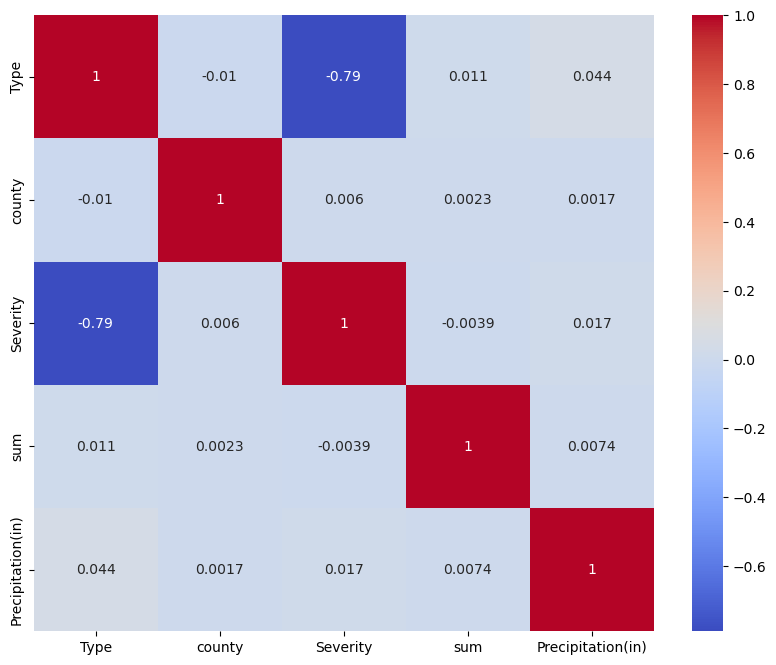

In [103]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix1, annot=True, cmap='coolwarm')
plt.show()

In [82]:
# Drop columns you don't need
columns_to_drop = ['state']  # List of columns to drop
d_final = df_final.drop(columns=columns_to_drop)

In [83]:
d_final

,date,county,fips_code,sum
0,2014-11-01,Abbeville,45001,70.0
1,2014-11-01,Accomack,51001,2.0
2,2014-11-01,Adams,8001,1.0
3,2014-11-01,Adams,17001,1.0
4,2014-11-01,Adams,18001,68.0
...,...,...,...,...
723923,2022-11-12,Young,48503,34.0
723924,2022-11-12,Yuba,6115,1.0
723925,2022-11-12,Zapata,48505,8.0
723926,2022-11-12,Zavala,48507,20.0


In [84]:
comdf=pd.merge(d_final, df55, on=['date', 'county'])

In [85]:
comdf.head()

,date,county,fips_code,sum,StartTime(UTC),EventId,Type,Severity,EndTime(UTC),Precipitation(in),TimeZone,AirportCode,LocationLat,LocationLng,City,state,ZipCode
0,2016-01-01,Addison,50001,16.0,2016-01-01 17:35:00,W-7958988,Snow,Light,2016-01-01 17:55:00,0.00,US/Eastern,K6B0,43.9855,-73.0955,Middlebury,VT,5753.0
1,2016-01-01,Addison,50001,16.0,2016-01-01 22:15:00,W-7958989,Snow,Light,2016-01-01 23:35:00,0.00,US/Eastern,K6B0,43.9855,-73.0955,Middlebury,VT,5753.0
2,2016-01-01,Alachua,12001,37.0,2016-01-01 12:53:00,W-7047775,Rain,Light,2016-01-01 13:53:00,0.00,US/Eastern,KGNV,29.6917,-82.2760,Gainesville,FL,32609.0
3,2016-01-01,Alachua,12001,37.0,2016-01-01 18:47:00,W-7047776,Rain,Light,2016-01-01 19:22:00,0.02,US/Eastern,KGNV,29.6917,-82.2760,Gainesville,FL,32609.0
4,2016-01-01,Alachua,12001,37.0,2016-01-01 21:53:00,W-7047777,Rain,Light,2016-01-01 22:03:00,0.03,US/Eastern,KGNV,29.6917,-82.2760,Gainesville,FL,32609.0


In [86]:
comb_df=comdf[['date','county','fips_code','sum','state','Type','Severity']]

In [87]:
comb_df

,date,county,fips_code,sum,state,Type,Severity
0,2016-01-01,Addison,50001,16.0,VT,Snow,Light
1,2016-01-01,Addison,50001,16.0,VT,Snow,Light
2,2016-01-01,Alachua,12001,37.0,FL,Rain,Light
3,2016-01-01,Alachua,12001,37.0,FL,Rain,Light
4,2016-01-01,Alachua,12001,37.0,FL,Rain,Light
...,...,...,...,...,...,...,...
25822945,2022-11-12,Yuba,6115,1.0,CA,Fog,Moderate
25822946,2022-11-12,Yuba,6115,1.0,CA,Fog,Severe
25822947,2022-11-12,Yuba,6115,1.0,CA,Fog,Moderate
25822948,2022-11-12,Yuba,6115,1.0,CA,Fog,Severe


In [88]:
dfwe=comb_df

In [89]:
dfwe

,date,county,fips_code,sum,state,Type,Severity
0,2016-01-01,Addison,50001,16.0,VT,Snow,Light
1,2016-01-01,Addison,50001,16.0,VT,Snow,Light
2,2016-01-01,Alachua,12001,37.0,FL,Rain,Light
3,2016-01-01,Alachua,12001,37.0,FL,Rain,Light
4,2016-01-01,Alachua,12001,37.0,FL,Rain,Light
...,...,...,...,...,...,...,...
25822945,2022-11-12,Yuba,6115,1.0,CA,Fog,Moderate
25822946,2022-11-12,Yuba,6115,1.0,CA,Fog,Severe
25822947,2022-11-12,Yuba,6115,1.0,CA,Fog,Moderate
25822948,2022-11-12,Yuba,6115,1.0,CA,Fog,Severe


In [90]:
import pandas as pd

# Assuming your data is in a DataFrame named df
# Select the columns of interest
selected_columns = ['Type', 'county', 'Severity', 'date', 'sum']

# Create a new DataFrame with the selected columns
selected_data = dfwe[selected_columns]

# Convert categorical variables to numerical using label encoding
selected_data['Type'] = pd.Categorical(selected_data['Type']).codes
selected_data['county'] = pd.Categorical(selected_data['county']).codes
selected_data['Severity'] = pd.Categorical(selected_data['Severity']).codes

# Calculate the correlation matrix
correlation_matrix = selected_data.corr()

# Display the correlation matrix
print(correlation_matrix)


C:\Users\halee\AppData\Local\Temp\ipykernel_10176\615943247.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_data['Type'] = pd.Categorical(selected_data['Type']).codes
C:\Users\halee\AppData\Local\Temp\ipykernel_10176\615943247.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_data['county'] = pd.Categorical(selected_data['county']).codes
C:\Users\halee\AppData\Local\Temp\ipykernel_10176\615943247.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from 

              Type    county  Severity       sum
Type      1.000000 -0.010174 -0.789186  0.010530
county   -0.010174  1.000000  0.006010  0.002290
Severity -0.789186  0.006010  1.000000 -0.003881
sum       0.010530  0.002290 -0.003881  1.000000


In [ ]:
# Convert run_start_time to datetime format
dfwe['date'] = pd.to_datetime(dfwe['date'])

# Set the run_start_time column as the DataFrame index
dfwe.set_index('date', inplace=True)

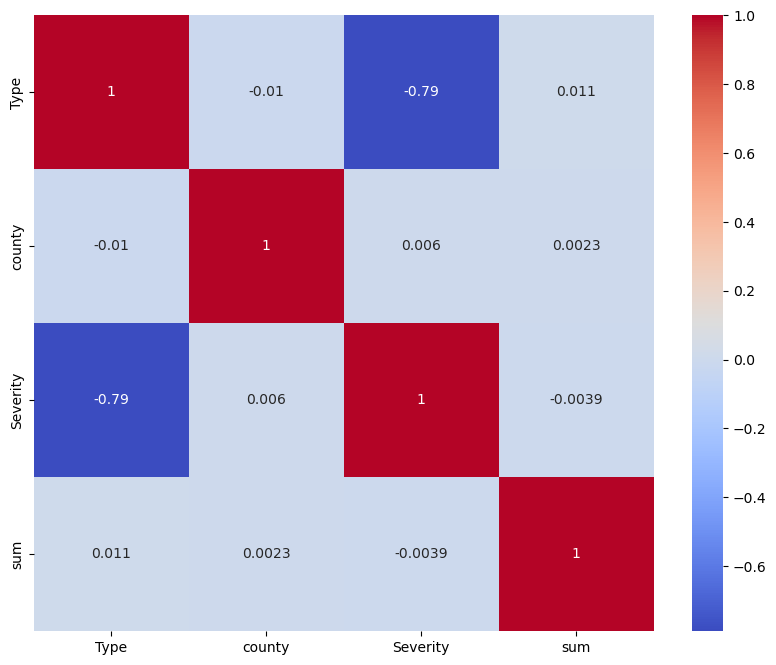

In [91]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.show()


In [94]:
threshold = 0.01  # Define your threshold
strong_correlations = correlation_matrix[correlation_matrix.abs() > threshold]
print(strong_correlations)

              Type    county  Severity      sum
Type      1.000000 -0.010174 -0.789186  0.01053
county   -0.010174  1.000000       NaN      NaN
Severity -0.789186       NaN  1.000000      NaN
sum       0.010530       NaN       NaN  1.00000


In [ ]:
dfwe.head()

In [ ]:
dfwe['year'] = dfwe.index.year

In [ ]:
dfwe['month']=dfwe.index.month

In [ ]:
# Assuming your DataFrame is named df
charleston_2019 = dfwe[(dfwe['county'] == 'Charleston') & (dfwe['year'] == 2019)]

In [ ]:
charleston_2019.head()

In [ ]:
charleston_2019=charleston_2019.reset_index()

In [ ]:
# Assuming your DataFrame is named df
charleston_2019 = dfwe[(dfwe['county'] == 'Charleston') & (dfwe['year'] == 2019)]

In [ ]:
charleston_2019.head()

In [ ]:

# Assuming your DataFrame is named df
charleston_2019 = dfwe[(dfwe['county'] == 'Charleston') & (dfwe['year'] == 2019)& (dfwe['month'] == 9) & (dfwe['Severity']=='Severe')]


In [ ]:
c=charleston_2019.reset_index()

In [402]:
print(c.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2019-09-04 & Charleston &      45019 &   1691.0 &    SC &   Fog &   Severe &  2019 &      9 \\
2019-09-05 & Charleston &      45019 & 137536.0 &    SC &   Fog &   Severe &  2019 &      9 \\
2019-09-05 & Charleston &      45019 & 137536.0 &    SC &   Fog &   Severe &  2019 &      9 \\
2019-09-05 & Charleston &      45019 & 137536.0 &    SC & Storm &   Severe &  2019 &      9 \\
2019-09-05 & Charleston &      45019 & 137536.0 &    SC & Storm &   Severe &  2019 &      9 \\
2019-09-05 & Charleston &      45019 & 137536.0 &    SC & Storm &   Severe &  2019 &      9 \\
2019-09-05 & Charleston &      45019 & 137536.0 &    SC & Storm &   Severe &  2019 &      9 \\
2019-09-05 & Charleston &      45019 & 137536.0 &    SC & Storm &   Severe &  2019 &      9 \\
2019-09-05 & Charleston &      45019 & 137536.0 &    SC &   Fog &   Severe &  2019 &      9 \\
2019

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\609306484.py:1: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(c.to_latex(index=False))


In [175]:
ol='sum'
nc='outage'
dfwe.rename(columns={ol:nc}, inplace=True)


C:\Users\halee\AppData\Local\Temp\ipykernel_5976\915138520.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfwe.rename(columns={ol:nc}, inplace=True)


In [176]:
dfwe

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-01-01,Addison,50001,16.0,VT,Snow,Light,2016,1
2016-01-01,Addison,50001,16.0,VT,Snow,Light,2016,1
2016-01-01,Alachua,12001,37.0,FL,Rain,Light,2016,1
2016-01-01,Alachua,12001,37.0,FL,Rain,Light,2016,1
2016-01-01,Alachua,12001,37.0,FL,Rain,Light,2016,1
...,...,...,...,...,...,...,...,...
2022-11-12,Yuba,6115,1.0,CA,Fog,Moderate,2022,11
2022-11-12,Yuba,6115,1.0,CA,Fog,Severe,2022,11
2022-11-12,Yuba,6115,1.0,CA,Fog,Moderate,2022,11


In [177]:
import pandas as pd

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)

storm_2019 = dfwe[(dfwe['year'] == 2019) & 
                  (dfwe['Severity'] == 'Severe') & 
                  (dfwe['Type'] == 'Storm') &
                  (dfwe['outage'] > 100000)]

# Print or display the resulting DataFrame
print(storm_2019)

                county  fips_code    outage state   Type Severity  year  month
date                                                                          
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-06-09      Dallas      48113  309108.0    TX  Storm   Severe  2019      6
2019-09-05  Charleston      45019  137536.0    SC  Storm   Severe  2019      9
2019-09-05  Charleston      45019  137536.0    SC  Storm   Severe  2019      9
2019-09-05  Charleston      45019  137536.0    SC  Storm   Severe  2019      9
2019-09-05  Charleston      45019  137536.0    SC  Storm   Severe  2019      9
2019-09-05  Charleston      45019  137536.0    SC  S

In [465]:
storm_2017 = dfwe[(dfwe['year'] == 2017) & 
                  (dfwe['Severity'] == 'Severe') & 
                  (dfwe['Type'] == 'Storm') &
                  (dfwe['outage'] > 100000)]

# Print or display the resulting DataFrame
print(storm_2017)

                  county  fips_code     outage state   Type Severity  year  \
date                                                                         
2017-05-28        Shelby      47157   155108.0    TN  Storm   Severe  2017   
2017-07-07          Kent      26081   110606.0    MI  Storm   Severe  2017   
2017-09-10       Broward      12011   709360.0    FL  Storm   Severe  2017   
2017-09-10       Broward      12011   709360.0    FL  Storm   Severe  2017   
2017-09-10       Broward      12011   709360.0    FL  Storm   Severe  2017   
2017-09-10       Broward      12011   709360.0    FL  Storm   Severe  2017   
2017-09-10       Broward      12011   709360.0    FL  Storm   Severe  2017   
2017-09-10       Broward      12011   709360.0    FL  Storm   Severe  2017   
2017-09-10       Broward      12011   709360.0    FL  Storm   Severe  2017   
2017-09-10       Broward      12011   709360.0    FL  Storm   Severe  2017   
2017-09-10       Broward      12011   709360.0    FL  Storm   Se

In [466]:
 storm_2017= storm_2017.drop_duplicates(subset=storm_2017.columns.difference(['outage']))
q33=storm_2017.reset_index()
print(q33.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &       county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2017-05-28 &       Shelby &      47157 & 155108.0 &    TN & Storm &   Severe &  2017 &      5 \\
2017-07-07 &         Kent &      26081 & 110606.0 &    MI & Storm &   Severe &  2017 &      7 \\
2017-09-10 &      Broward &      12011 & 709360.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &      Collier &      12021 & 196390.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &          Lee &      12071 & 227810.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &   Miami-Dade &      12086 & 898340.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &   Palm Beach &      12099 & 543450.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-11 &      Brevard &      12009 & 522957.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-11 &    Charlotte &      12015 & 136740.0 &    FL & Storm &   Severe &  2

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\32181749.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q33.to_latex(index=False))


In [482]:
storm_2018 = dfwe[(dfwe['year'] == 2018) & 
                  (dfwe['Severity'] == 'Severe') & 
                  (dfwe['Type'] == 'Storm') &
                  (dfwe['outage'] > 100000)]

# Print or display the resulting DataFrame
print(storm_2018)

                 county  fips_code    outage state   Type Severity  year  \
date                                                                       
2018-03-03   Barnstable      25001  103060.0    MA  Storm   Severe  2018   
2018-03-03   Barnstable      25001  103060.0    MA  Storm   Severe  2018   
2018-03-03   Barnstable      25001  103060.0    MA  Storm   Severe  2018   
2018-03-03   Barnstable      25001  103060.0    MA  Storm   Severe  2018   
2018-03-03     Delaware      42045  109686.0    PA  Storm   Severe  2018   
2018-03-03     Plymouth      25023  141383.0    MA  Storm   Severe  2018   
2018-03-13   Barnstable      25001  124332.0    MA  Storm   Severe  2018   
2018-03-13   Barnstable      25001  124332.0    MA  Storm   Severe  2018   
2018-03-14   Barnstable      25001  128268.0    MA  Storm   Severe  2018   
2018-07-10     Maricopa       4013  109160.0    AZ  Storm   Severe  2018   
2018-07-10     Maricopa       4013  109160.0    AZ  Storm   Severe  2018   
2018-07-10  

In [468]:
 storm_2018= storm_2018.drop_duplicates(subset=storm_2018.columns.difference(['outage']))
q34=storm_2018.reset_index()
print(q34.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &      county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2018-03-03 &  Barnstable &      25001 & 103060.0 &    MA & Storm &   Severe &  2018 &      3 \\
2018-03-03 &    Delaware &      42045 & 109686.0 &    PA & Storm &   Severe &  2018 &      3 \\
2018-03-03 &    Plymouth &      25023 & 141383.0 &    MA & Storm &   Severe &  2018 &      3 \\
2018-07-10 &    Maricopa &       4013 & 109160.0 &    AZ & Storm &   Severe &  2018 &      7 \\
2018-09-14 & New Hanover &      37129 & 114738.0 &    NC & Storm &   Severe &  2018 &      9 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2704615553.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q34.to_latex(index=False))


In [469]:
storm_2016 = dfwe[(dfwe['year'] == 2016) & 
                  (dfwe['Severity'] == 'Severe') & 
                  (dfwe['Type'] == 'Storm') &
                  (dfwe['outage'] > 100000)]

# Print or display the resulting DataFrame
print(storm_2016)

             county  fips_code    outage state   Type Severity  year  month
date                                                                       
2016-10-07  Brevard      12009  200786.0    FL  Storm   Severe  2016     10
2016-10-07  Brevard      12009  200786.0    FL  Storm   Severe  2016     10
2016-10-07  Brevard      12009  200786.0    FL  Storm   Severe  2016     10
2016-10-07  Brevard      12009  200786.0    FL  Storm   Severe  2016     10
2016-10-07    Duval      12031  207466.0    FL  Storm   Severe  2016     10
2016-10-07    Duval      12031  207466.0    FL  Storm   Severe  2016     10
2016-10-07    Duval      12031  207466.0    FL  Storm   Severe  2016     10
2016-10-07    Duval      12031  207466.0    FL  Storm   Severe  2016     10
2016-10-07    Duval      12031  207466.0    FL  Storm   Severe  2016     10
2016-10-07    Duval      12031  207466.0    FL  Storm   Severe  2016     10
2016-10-07    Duval      12031  207466.0    FL  Storm   Severe  2016     10
2016-10-07  

In [470]:
 storm_2016= storm_2016.drop_duplicates(subset=storm_2016.columns.difference(['outage']))
q35=storm_2016.reset_index()
print(q35.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &  county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2016-10-07 & Brevard &      12009 & 200786.0 &    FL & Storm &   Severe &  2016 &     10 \\
2016-10-07 &   Duval &      12031 & 207466.0 &    FL & Storm &   Severe &  2016 &     10 \\
2016-10-07 & Volusia &      12127 & 235478.0 &    FL & Storm &   Severe &  2016 &     10 \\
2016-10-08 & Chatham &      13051 & 141489.0 &    GA & Storm &   Severe &  2016 &     10 \\
2016-10-08 &   Horry &      45051 & 180523.0 &    SC & Storm &   Severe &  2016 &     10 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3196878742.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q35.to_latex(index=False))


In [471]:
storm_2019 = dfwe[(dfwe['year'] == 2019) & 
                  (dfwe['Severity'] == 'Severe') & 
                  (dfwe['Type'] == 'Storm') &
                  (dfwe['outage'] > 100000)]

# Print or display the resulting DataFrame
print(storm_2019)

                county  fips_code    outage state   Type Severity  year  month
date                                                                          
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-01-07  Sacramento       6067  135474.0    CA  Storm   Severe  2019      1
2019-06-09      Dallas      48113  309108.0    TX  Storm   Severe  2019      6
2019-09-05  Charleston      45019  137536.0    SC  Storm   Severe  2019      9
2019-09-05  Charleston      45019  137536.0    SC  Storm   Severe  2019      9
2019-09-05  Charleston      45019  137536.0    SC  Storm   Severe  2019      9
2019-09-05  Charleston      45019  137536.0    SC  Storm   Severe  2019      9
2019-09-05  Charleston      45019  137536.0    SC  S

In [475]:
 storm_2019= storm_2019.drop_duplicates(subset=storm_2019.columns.difference(['outage']))
q37=storm_2019.reset_index()
print(q37.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2019-01-07 & Sacramento &       6067 & 135474.0 &    CA & Storm &   Severe &  2019 &      1 \\
2019-06-09 &     Dallas &      48113 & 309108.0 &    TX & Storm &   Severe &  2019 &      6 \\
2019-09-05 & Charleston &      45019 & 137536.0 &    SC & Storm &   Severe &  2019 &      9 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3189770708.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q37.to_latex(index=False))


In [472]:
storm_2020 = dfwe[(dfwe['year'] == 2020) & 
                  (dfwe['Severity'] == 'Severe') & 
                  (dfwe['Type'] == 'Storm') &
                  (dfwe['outage'] > 100000)]

# Print or display the resulting DataFrame
print(storm_2020)

               county  fips_code    outage state   Type Severity  year  month
date                                                                         
2020-07-26    Hidalgo      48215  153337.0    TX  Storm   Severe  2020      7
2020-07-26    Hidalgo      48215  153337.0    TX  Storm   Severe  2020      7
2020-07-26    Hidalgo      48215  153337.0    TX  Storm   Severe  2020      7
2020-08-04  Fairfield       9001  175182.0    CT  Storm   Severe  2020      8
2020-08-04  Fairfield       9001  175182.0    CT  Storm   Severe  2020      8
2020-08-04  New Haven       9009  123915.0    CT  Storm   Severe  2020      8
2020-08-04      Ocean      34029  216332.0    NJ  Storm   Severe  2020      8
2020-08-04      Ocean      34029  216332.0    NJ  Storm   Severe  2020      8
2020-08-04      Ocean      34029  216332.0    NJ  Storm   Severe  2020      8
2020-08-04      Ocean      34029  216332.0    NJ  Storm   Severe  2020      8
2020-08-10       Cook      17031  209415.0    IL  Storm   Severe

In [476]:
 storm_2020= storm_2020.drop_duplicates(subset=storm_2020.columns.difference(['outage']))
q38=storm_2020.reset_index()
print(q38.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &    county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2020-07-26 &   Hidalgo &      48215 & 153337.0 &    TX & Storm &   Severe &  2020 &      7 \\
2020-08-04 & Fairfield &       9001 & 175182.0 &    CT & Storm &   Severe &  2020 &      8 \\
2020-08-04 & New Haven &       9009 & 123915.0 &    CT & Storm &   Severe &  2020 &      8 \\
2020-08-04 &     Ocean &      34029 & 216332.0 &    NJ & Storm &   Severe &  2020 &      8 \\
2020-08-10 &      Cook &      17031 & 209415.0 &    IL & Storm &   Severe &  2020 &      8 \\
2020-08-10 &      Linn &      19113 & 109389.0 &    IA & Storm &   Severe &  2020 &      8 \\
2020-08-10 &      Polk &      19153 & 114873.0 &    IA & Storm &   Severe &  2020 &      8 \\
2020-08-27 & Calcasieu &      22019 & 102957.0 &    LA & Storm &   Severe &  2020 &      8 \\
2020-09-16 &   Baldwin &       1003 & 126286.0 &    AL & Storm &   Severe &  2020 &      9 \\
2020-09-16 &  

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2160829090.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q38.to_latex(index=False))


In [473]:
storm_2021 = dfwe[(dfwe['year'] == 2021) & 
                  (dfwe['Severity'] == 'Severe') & 
                  (dfwe['Type'] == 'Storm') &
                  (dfwe['outage'] > 100000)]

# Print or display the resulting DataFrame
print(storm_2021)

                      county  fips_code    outage state   Type Severity  year  \
date                                                                            
2021-01-13            Pierce      53053  107403.0    WA  Storm   Severe  2021   
2021-01-13            Pierce      53053  107403.0    WA  Storm   Severe  2021   
2021-01-27        Sacramento       6067  156263.0    CA  Storm   Severe  2021   
2021-01-27        Sacramento       6067  156263.0    CA  Storm   Severe  2021   
2021-01-27        Sacramento       6067  156263.0    CA  Storm   Severe  2021   
2021-01-27        Sacramento       6067  156263.0    CA  Storm   Severe  2021   
2021-01-27        Sacramento       6067  156263.0    CA  Storm   Severe  2021   
2021-02-12       Los Angeles       6037  114577.0    CA  Storm   Severe  2021   
2021-02-12       Los Angeles       6037  114577.0    CA  Storm   Severe  2021   
2021-07-10           Douglas      31055  138327.0    NE  Storm   Severe  2021   
2021-07-10           Douglas

In [477]:
 storm_2021= storm_2021.drop_duplicates(subset=storm_2021.columns.difference(['outage']))
q39=storm_2021.reset_index()
print(q39.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &           county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2021-01-13 &           Pierce &      53053 & 107403.0 &    WA & Storm &   Severe &  2021 &      1 \\
2021-01-27 &       Sacramento &       6067 & 156263.0 &    CA & Storm &   Severe &  2021 &      1 \\
2021-02-12 &      Los Angeles &       6037 & 114577.0 &    CA & Storm &   Severe &  2021 &      2 \\
2021-07-10 &          Douglas &      31055 & 138327.0 &    NE & Storm &   Severe &  2021 &      7 \\
2021-07-25 &          Oakland &      26125 & 102102.0 &    MI & Storm &   Severe &  2021 &      7 \\
2021-08-11 &            Wayne &      26163 & 150144.0 &    MI & Storm &   Severe &  2021 &      8 \\
2021-08-11 &            Wayne &      26163 & 150144.0 &    OH & Storm &   Severe &  2021 &      8 \\
2021-08-29 &        Jefferson &      22051 & 195893.0 &    LA & Storm &   Severe &  2021 &      8 \\
2021-08-29 &          Orleans &      22071 & 

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2361027418.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q39.to_latex(index=False))


In [478]:
storm_2022 = dfwe[(dfwe['year'] == 2022) & 
                  (dfwe['Severity'] == 'Severe') & 
                  (dfwe['Type'] == 'Storm') &
                  (dfwe['outage'] > 100000)]

# Print or display the resulting DataFrame
print(storm_2022)

                  county  fips_code    outage state   Type Severity  year  \
date                                                                        
2022-09-04        Dallas      48113  120548.0    TX  Storm   Severe  2022   
2022-09-04        Dallas      48113  120548.0    TX  Storm   Severe  2022   
2022-09-28     Charlotte      12015  125744.0    FL  Storm   Severe  2022   
2022-09-28     Charlotte      12015  125744.0    FL  Storm   Severe  2022   
2022-09-28     Charlotte      12015  125744.0    FL  Storm   Severe  2022   
2022-09-28     Charlotte      12015  125744.0    FL  Storm   Severe  2022   
2022-09-28     Charlotte      12015  125744.0    FL  Storm   Severe  2022   
2022-09-28     Charlotte      12015  125744.0    FL  Storm   Severe  2022   
2022-09-28     Charlotte      12015  125744.0    FL  Storm   Severe  2022   
2022-09-28       Collier      12021  200728.0    FL  Storm   Severe  2022   
2022-09-28       Collier      12021  200728.0    FL  Storm   Severe  2022   

In [479]:
 storm_2022= storm_2022.drop_duplicates(subset=storm_2022.columns.difference(['outage']))
q40=storm_2022.reset_index()
print(q40.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &       county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2022-09-04 &       Dallas &      48113 & 120548.0 &    TX & Storm &   Severe &  2022 &      9 \\
2022-09-28 &    Charlotte &      12015 & 125744.0 &    FL & Storm &   Severe &  2022 &      9 \\
2022-09-28 &      Collier &      12021 & 200728.0 &    FL & Storm &   Severe &  2022 &      9 \\
2022-09-28 & Hillsborough &      12057 & 177912.0 &    FL & Storm &   Severe &  2022 &      9 \\
2022-09-28 &          Lee &      12071 & 456323.0 &    FL & Storm &   Severe &  2022 &      9 \\
2022-09-28 &      Manatee &      12081 & 148599.0 &    FL & Storm &   Severe &  2022 &      9 \\
2022-09-28 &     Pinellas &      12103 & 167357.0 &    FL & Storm &   Severe &  2022 &      9 \\
2022-09-28 &     Sarasota &      12115 & 246960.0 &    FL & Storm &   Severe &  2022 &      9 \\
2022-09-29 &       Orange &      12095 & 229025.0 &    FL & Storm &   Severe &  2

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2425848109.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q40.to_latex(index=False))


In [481]:
storm_2021t= storm_2021t.drop_duplicates(subset=storm_2021t.columns.difference(['outage']))
q41=storm_2021t.reset_index()
print(q41.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2021-01-13 &       King &      53033 & 215586.0 &    WA &          Rain &    Light &  2021 &      1 \\
2021-01-13 &       King &      53033 & 215586.0 &    WA &          Cold &   Severe &  2021 &      1 \\
2021-01-13 &       King &      53033 & 215586.0 &    WA &          Rain & Moderate &  2021 &      1 \\
2021-02-15 &      Bexar &      48029 & 218382.0 &    TX &          Snow &    Light &  2021 &      2 \\
2021-02-15 &      Bexar &      48029 & 218382.0 &    TX &          Rain &    Light &  2021 &      2 \\
2021-02-15 &      Bexar &      48029 & 218382.0 &    TX &           Fog & Moderate &  2021 &      2 \\
2021-02-15 &      Bexar &      48029 & 218382.0 &    TX &          Snow & Moderate &  2021 &      2 \\
2021-02-15 &      Bexar &      48029 & 218382.0 &    TX &           Fog &   Severe &  2021 &      2 \\
2021-02-15 &     Dallas &  

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2879116971.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q41.to_latex(index=False))


In [480]:
storm_2021t = dfwe[(dfwe['year'] == 2021) & 
                  
                  (dfwe['outage'] > 200000)]

# Print or display the resulting DataFrame
print(storm_2021t)

                county  fips_code    outage state           Type  Severity  \
date                                                                         
2021-01-13        King      53033  215586.0    WA           Rain     Light   
2021-01-13        King      53033  215586.0    WA           Rain     Light   
2021-01-13        King      53033  215586.0    WA           Cold    Severe   
2021-01-13        King      53033  215586.0    WA           Rain     Light   
2021-01-13        King      53033  215586.0    WA           Rain  Moderate   
2021-01-13        King      53033  215586.0    WA           Rain     Light   
2021-01-13        King      53033  215586.0    WA           Rain  Moderate   
2021-01-13        King      53033  215586.0    WA           Rain     Light   
2021-01-13        King      53033  215586.0    WA           Rain  Moderate   
2021-01-13        King      53033  215586.0    WA           Rain     Light   
2021-01-13        King      53033  215586.0    WA           Cold

In [192]:


# Group by county and date to calculate the highest outages for each county on any given day
grouped = dfwe.groupby(['county', 'fips_code', 'state', 'Type', 'Severity', 'year', 'month', 'date']).max()
grouped = grouped.reset_index()

# Group by county and date to find the highest outage on any day for each county
daily_max_outages = grouped.groupby(['county', 'fips_code', 'state', 'Type', 'Severity', 'year', 'month', 'date'])['outage'].max()
daily_max_outages = daily_max_outages.reset_index()


daily_max_outages.head()








,county,fips_code,state,Type,Severity,year,month,date,outage
0,Accomack,51001,VA,Cold,Severe,2016,1,2016-01-19,312.0
1,Accomack,51001,VA,Cold,Severe,2016,1,2016-01-23,11020.0
2,Accomack,51001,VA,Cold,Severe,2016,2,2016-02-11,2.0
3,Accomack,51001,VA,Cold,Severe,2016,2,2016-02-16,4.0
4,Accomack,51001,VA,Cold,Severe,2016,2,2016-02-24,4492.0


In [196]:

daily_max_outages.head()

,county,fips_code,state,Type,Severity,year,month,date,outage
0,Accomack,51001,VA,Cold,Severe,2016,1,2016-01-19,312.0
1,Accomack,51001,VA,Cold,Severe,2016,1,2016-01-23,11020.0
2,Accomack,51001,VA,Cold,Severe,2016,2,2016-02-11,2.0
3,Accomack,51001,VA,Cold,Severe,2016,2,2016-02-16,4.0
4,Accomack,51001,VA,Cold,Severe,2016,2,2016-02-24,4492.0


In [195]:
# Find the top 10 counties with the highest outage on any day
top_counties = daily_max_outages.groupby('county', 'fips_code', 'state', 'Type', 'Severity', 'year', 'month', 'date')['outage'].sum().sort_values(ascending=False).head(10)
top_counties

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3624196186.py:2: FutureWarning: The `squeeze` parameter is deprecated and will be removed in a future version.
  top_counties = daily_max_outages.groupby('county', 'fips_code', 'state', 'Type', 'Severity', 'year', 'month', 'date')['outage'].sum().sort_values(ascending=False).head(10)


ValueError: No axis named fips_code for object type DataFrame

In [193]:
# Find the top 10 counties with the highest outage on any day
top_counties = daily_max_outages.groupby('county', 'fips_code', 'state', 'Type', 'Severity', 'year', 'month', 'date')['outage'].max().sort_values(ascending=False).head(10)




C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3337923067.py:2: FutureWarning: The `squeeze` parameter is deprecated and will be removed in a future version.
  top_counties = daily_max_outages.groupby('county', 'fips_code', 'state', 'Type', 'Severity', 'year', 'month', 'date')['outage'].max().sort_values(ascending=False).head(10)


ValueError: No axis named fips_code for object type DataFrame

In [191]:
grouped.head()

,county,fips_code,state,Type,Severity,year,month,date,outage
0,Accomack,51001,VA,Cold,Severe,2016,1,2016-01-19,312.0
1,Accomack,51001,VA,Cold,Severe,2016,1,2016-01-23,11020.0
2,Accomack,51001,VA,Cold,Severe,2016,2,2016-02-11,2.0
3,Accomack,51001,VA,Cold,Severe,2016,2,2016-02-16,4.0
4,Accomack,51001,VA,Cold,Severe,2016,2,2016-02-24,4492.0


In [186]:
top_counties

county
Miami-Dade    1777800.0
Broward       1398920.0
Palm Beach    1098160.0
Duval          528830.0
Brevard        522957.0
Lee            462570.0
Pinellas       417553.0
Harris         374745.0
Tarrant        367316.0
Dallas         358650.0
Name: outage, dtype: float64

In [404]:
q3=top_counties.reset_index()
print(q3.to_latex(index=False))

\begin{tabular}{lr}
\toprule
    county &    outage \\
\midrule
Miami-Dade & 1777800.0 \\
   Broward & 1398920.0 \\
Palm Beach & 1098160.0 \\
     Duval &  528830.0 \\
   Brevard &  522957.0 \\
       Lee &  462570.0 \\
  Pinellas &  417553.0 \\
    Harris &  374745.0 \\
   Tarrant &  367316.0 \\
    Dallas &  358650.0 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2991294239.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q3.to_latex(index=False))


In [197]:
# Find the top 10 counties with the highest outage on any day
top_counties = daily_max_outages.groupby('county').max().sort_values(ascending=False).head(10)

TypeError: DataFrame.sort_values() missing 1 required positional argument: 'by'

In [203]:
# Find the top 10 counties with the highest outage on any day
top_counties = daily_max_outages.groupby('county')['outage'].max().sort_values(ascending=False).nlargest(10)

In [201]:
top_counties

county
Miami-Dade    1777800.0
Broward       1398920.0
Palm Beach    1098160.0
Duval          528830.0
Brevard        522957.0
Lee            462570.0
Pinellas       417553.0
Harris         374745.0
Tarrant        367316.0
Dallas         358650.0
Name: outage, dtype: float64

TypeError: Column 'county' has dtype object, cannot use method 'nlargest' with this dtype

In [205]:
top_10_counties

,county,fips_code,state,Type,Severity,year,month,date,outage
5990294,Miami-Dade,12086,FL,Rain,Light,2017,9,2017-09-11,1777800.0
5992539,Miami-Dade,12086,FL,Storm,Severe,2017,9,2017-09-11,1777800.0
479304,Broward,12011,FL,Cold,Severe,2017,9,2017-09-11,1398920.0
6998433,Palm Beach,12099,FL,Cold,Severe,2017,9,2017-09-11,1098160.0
5988164,Miami-Dade,12086,FL,Cold,Severe,2017,9,2017-09-10,898340.0
5989474,Miami-Dade,12086,FL,Rain,Heavy,2017,9,2017-09-10,898340.0
5990293,Miami-Dade,12086,FL,Rain,Light,2017,9,2017-09-10,898340.0
5992000,Miami-Dade,12086,FL,Rain,Moderate,2017,9,2017-09-10,898340.0
5992538,Miami-Dade,12086,FL,Storm,Severe,2017,9,2017-09-10,898340.0
5990295,Miami-Dade,12086,FL,Rain,Light,2017,9,2017-09-12,752660.0


In [207]:
# Group by county and date to calculate the highest outages for each county on any given day
groupeds = dfwe.groupby([ 'state', 'date']).max()
groupeds = groupeds.reset_index()

# Group by county and date to find the highest outage on any day for each county
daily_max_outagess = grouped.groupby([ 'state', 'date'])['outage'].max()
daily_max_outagess = daily_max_outagess.reset_index()


daily_max_outagess.head()


,state,date,outage
0,AL,2016-01-01,836.0
1,AL,2016-01-02,198.0
2,AL,2016-01-03,98.0
3,AL,2016-01-05,8601.0
4,AL,2016-01-06,19.0


In [208]:
top_states = daily_max_outagess.groupby('state')['outage'].max().sort_values(ascending=False).nlargest(10)

In [405]:
q4=top_states.reset_index()
print(q4.to_latex(index=False))

\begin{tabular}{lr}
\toprule
state &    outage \\
\midrule
   FL & 1777800.0 \\
   NC &  462570.0 \\
   VA &  462570.0 \\
   IA &  456573.0 \\
   TX &  374745.0 \\
   MA &  351202.0 \\
   NY &  331670.0 \\
   KY &  311925.0 \\
   NE &  311925.0 \\
   CA &  291808.0 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1537868793.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q4.to_latex(index=False))


In [216]:
import pandas as pd

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)

# Assuming your DataFrame is named df
storm_2021tx = dfwe[( (dfwe['year'] == 2021) & (dfwe['Severity']=='Severe') &  (dfwe['state']=='TX') & (dfwe['county']=='Dallas')  &(dfwe['outage'] > 1000)& (dfwe['month']==2))]

In [408]:
# Drop duplicates based on all columns except the 'outage' column
storm_2021tx = storm_2021tx.drop_duplicates(subset=storm_2021tx.columns.difference(['outage']))
q5=storm_2021tx.reset_index()
print(q5.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date & county &  fips\_code &  outage & state &  Type & Severity &  year &  month \\
\midrule
2021-02-09 & Dallas &      48113 &  1087.0 &    TX &   Fog &   Severe &  2021 &      2 \\
2021-02-13 & Dallas &      48113 &  2630.0 &    TX & Storm &   Severe &  2021 &      2 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3909935215.py:4: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q5.to_latex(index=False))


In [221]:
import pandas as pd

# Set display options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', None)

# Assuming your DataFrame is named df
storm_2021txhh = dfwe[( (dfwe['year'] == 2021) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='TX') &(dfwe['outage'] > 100000)  & (dfwe['month']==2))]

In [222]:
storm_2021txhh

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2021-02-15,Bexar,48029,218382.0,TX,Fog,Severe,2021,2
2021-02-15,Dallas,48113,313948.0,TX,Fog,Severe,2021,2
2021-02-15,Denton,48121,108891.0,TX,Cold,Severe,2021,2
2021-02-15,Denton,48121,108891.0,TX,Cold,Severe,2021,2
2021-02-15,Denton,48121,108891.0,TX,Cold,Severe,2021,2
2021-02-15,Denton,48121,108891.0,TX,Cold,Severe,2021,2
2021-02-15,Denton,48121,108891.0,TX,Cold,Severe,2021,2
2021-02-15,Tarrant,48439,347719.0,TX,Fog,Severe,2021,2
2021-02-15,Tarrant,48439,347719.0,TX,Fog,Severe,2021,2


In [409]:
storm_2021txhh = storm_2021txhh.drop_duplicates(subset=storm_2021txhh.columns.difference(['outage']))
q6=storm_2021txhh.reset_index()
print(q6.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &   outage & state & Type & Severity &  year &  month \\
\midrule
2021-02-15 &      Bexar &      48029 & 218382.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 &     Dallas &      48113 & 313948.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 &     Denton &      48121 & 108891.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-15 &    Tarrant &      48439 & 347719.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 &     Travis &      48453 & 237258.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 &     Travis &      48453 & 237258.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-15 & Williamson &      48491 & 114523.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-16 &      Bexar &      48029 & 329782.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-16 &  Fort Bend &      48157 & 163337.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-16 &  

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1774868685.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q6.to_latex(index=False))


In [412]:
# Assuming your DataFrame is named df
storm_2021tra = dfwe[( (dfwe['year'] == 2021) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='TX')  & (dfwe['county']=='Travis')  &(dfwe['outage'] > 100000)&(dfwe['month']==2))]

In [413]:
storm_2021tra

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2021-02-15,Travis,48453,237258.0,TX,Fog,Severe,2021,2
2021-02-15,Travis,48453,237258.0,TX,Fog,Severe,2021,2
2021-02-15,Travis,48453,237258.0,TX,Cold,Severe,2021,2
2021-02-15,Travis,48453,237258.0,TX,Fog,Severe,2021,2
2021-02-15,Travis,48453,237258.0,TX,Cold,Severe,2021,2
2021-02-15,Travis,48453,237258.0,TX,Fog,Severe,2021,2
2021-02-15,Travis,48453,237258.0,TX,Fog,Severe,2021,2
2021-02-15,Travis,48453,237258.0,TX,Fog,Severe,2021,2
2021-02-15,Travis,48453,237258.0,TX,Cold,Severe,2021,2


In [414]:

q7=storm_2021tra.reset_index()
print(q7.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date & county &  fips\_code &   outage & state & Type & Severity &  year &  month \\
\midrule
2021-02-15 & Travis &      48453 & 237258.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 & Travis &      48453 & 237258.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 & Travis &      48453 & 237258.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-15 & Travis &      48453 & 237258.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 & Travis &      48453 & 237258.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-15 & Travis &      48453 & 237258.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 & Travis &      48453 & 237258.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 & Travis &      48453 & 237258.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 & Travis &      48453 & 237258.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-15 & Travis &      48453 & 237258.0 &    TX & 

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3146680545.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q7.to_latex(index=False))


In [226]:
# Assuming your DataFrame is named df
storm_2021ha = dfwe[( (dfwe['year'] == 2021) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='TX')  & (dfwe['county']=='Harris')  &(dfwe['outage'] > 100000) &(dfwe['month']==2))]

In [227]:
storm_2021ha

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2021-02-17,Harris,48201,374745.0,TX,Fog,Severe,2021,2
2021-02-17,Harris,48201,374745.0,TX,Fog,Severe,2021,2
2021-02-17,Harris,48201,374745.0,TX,Fog,Severe,2021,2
2021-02-17,Harris,48201,374745.0,TX,Fog,Severe,2021,2
2021-02-17,Harris,48201,374745.0,TX,Fog,Severe,2021,2


In [415]:

q8=storm_2021ha.reset_index()
print(q8.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date & county &  fips\_code &   outage & state & Type & Severity &  year &  month \\
\midrule
2021-02-17 & Harris &      48201 & 374745.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-17 & Harris &      48201 & 374745.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-17 & Harris &      48201 & 374745.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-17 & Harris &      48201 & 374745.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-17 & Harris &      48201 & 374745.0 &    TX &  Fog &   Severe &  2021 &      2 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\4164342494.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q8.to_latex(index=False))


In [232]:
# Assuming your DataFrame is named df
storm_2021boston = dfwe[( (dfwe['year'] == 2021) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='MA')  & (dfwe['county']=='Suffolk') & (dfwe['month']==11))]

In [233]:
storm_2021boston

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2021-11-12,Suffolk,25025,137.0,MA,Storm,Severe,2021,11
2021-11-12,Suffolk,36103,2659.0,MA,Storm,Severe,2021,11
2021-11-12,Suffolk,51800,16.0,MA,Storm,Severe,2021,11


In [417]:
q9=storm_2021boston.reset_index()
print(q9.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &  county &  fips\_code &  outage & state &  Type & Severity &  year &  month \\
\midrule
2021-11-12 & Suffolk &      25025 &   137.0 &    MA & Storm &   Severe &  2021 &     11 \\
2021-11-12 & Suffolk &      36103 &  2659.0 &    MA & Storm &   Severe &  2021 &     11 \\
2021-11-12 & Suffolk &      51800 &    16.0 &    MA & Storm &   Severe &  2021 &     11 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2676944552.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q9.to_latex(index=False))


In [236]:
# Assuming your DataFrame is named df
storm_2021wa = dfwe[( (dfwe['year'] == 2021) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='TX')  & (dfwe['county']=='Washington') &(dfwe['outage'] > 10000)&(dfwe['month']==2))]

In [237]:
storm_2021wa

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2021-02-15,Washington,41067,29747.0,TX,Fog,Severe,2021,2
2021-02-15,Washington,41067,29747.0,TX,Cold,Severe,2021,2
2021-02-15,Washington,41067,29747.0,TX,Cold,Severe,2021,2
2021-02-15,Washington,41067,29747.0,TX,Cold,Severe,2021,2
2021-02-15,Washington,41067,29747.0,TX,Cold,Severe,2021,2
2021-02-15,Washington,41067,29747.0,TX,Cold,Severe,2021,2
2021-02-15,Washington,41067,29747.0,TX,Cold,Severe,2021,2
2021-02-15,Washington,41067,29747.0,TX,Cold,Severe,2021,2
2021-02-16,Washington,41067,12469.0,TX,Cold,Severe,2021,2


In [418]:
storm_2021wa = storm_2021wa.drop_duplicates(subset=storm_2021wa.columns.difference(['outage']))
q10=storm_2021wa.reset_index()
print(q10.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &  outage & state & Type & Severity &  year &  month \\
\midrule
2021-02-15 & Washington &      41067 & 29747.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-15 & Washington &      41067 & 29747.0 &    TX & Cold &   Severe &  2021 &      2 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3914414344.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q10.to_latex(index=False))


In [238]:
storm_2021da = dfwe[( (dfwe['year'] == 2021) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='TX')  & (dfwe['county']=='Dallas') & (dfwe['month']==2)&(dfwe['outage'] > 10000))]

In [239]:
storm_2021da

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2021-02-15,Dallas,48113,313948.0,TX,Fog,Severe,2021,2
2021-02-17,Dallas,48113,283256.0,TX,Fog,Severe,2021,2
2021-02-17,Dallas,48113,283256.0,TX,Fog,Severe,2021,2
2021-02-17,Dallas,48113,283256.0,TX,Fog,Severe,2021,2


In [419]:
q11=storm_2021da.reset_index()
print(q11.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date & county &  fips\_code &   outage & state & Type & Severity &  year &  month \\
\midrule
2021-02-15 & Dallas &      48113 & 313948.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-17 & Dallas &      48113 & 283256.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-17 & Dallas &      48113 & 283256.0 &    TX &  Fog &   Severe &  2021 &      2 \\
2021-02-17 & Dallas &      48113 & 283256.0 &    TX &  Fog &   Severe &  2021 &      2 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1718658987.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q11.to_latex(index=False))


In [424]:
storm_2021tar = dfwe[( (dfwe['year'] == 2021) & (dfwe['Severity']=='Severe') &(dfwe['Type']=='Cold') & (dfwe['state']=='TX')  & (dfwe['county']=='Tarrant') & (dfwe['month']==2))]

In [425]:
storm_2021tar

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2021-02-05,Tarrant,48439,532.0,TX,Cold,Severe,2021,2
2021-02-13,Tarrant,48439,1612.0,TX,Cold,Severe,2021,2
2021-02-16,Tarrant,48439,367316.0,TX,Cold,Severe,2021,2
2021-02-16,Tarrant,48439,367316.0,TX,Cold,Severe,2021,2
2021-02-16,Tarrant,48439,367316.0,TX,Cold,Severe,2021,2
2021-02-17,Tarrant,48439,235554.0,TX,Cold,Severe,2021,2
2021-02-17,Tarrant,48439,235554.0,TX,Cold,Severe,2021,2
2021-02-17,Tarrant,48439,235554.0,TX,Cold,Severe,2021,2


In [426]:

q12=storm_2021tar.reset_index()
print(q12.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &  county &  fips\_code &   outage & state & Type & Severity &  year &  month \\
\midrule
2021-02-05 & Tarrant &      48439 &    532.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-13 & Tarrant &      48439 &   1612.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-16 & Tarrant &      48439 & 367316.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-16 & Tarrant &      48439 & 367316.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-16 & Tarrant &      48439 & 367316.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-17 & Tarrant &      48439 & 235554.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-17 & Tarrant &      48439 & 235554.0 &    TX & Cold &   Severe &  2021 &      2 \\
2021-02-17 & Tarrant &      48439 & 235554.0 &    TX & Cold &   Severe &  2021 &      2 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3526699392.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q12.to_latex(index=False))


In [251]:
storm_2017har = dfwe[( (dfwe['year'] == 2017) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='TX')  & (dfwe['county']=='Harris')&(dfwe['outage'] > 1000)) ]

In [252]:
storm_2017har

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2017-02-08,Harris,13145,1430.0,TX,Fog,Severe,2017,2
2017-02-08,Harris,13145,1430.0,TX,Cold,Severe,2017,2
2017-09-16,Harris,13145,1118.0,TX,Fog,Severe,2017,9
2017-09-16,Harris,13145,1118.0,TX,Fog,Severe,2017,9
2017-09-16,Harris,13145,1118.0,TX,Fog,Severe,2017,9
2017-09-16,Harris,13145,1118.0,TX,Fog,Severe,2017,9
2017-09-16,Harris,13145,1118.0,TX,Fog,Severe,2017,9
2017-12-03,Harris,48201,6693.0,TX,Fog,Severe,2017,12
2017-12-03,Harris,48201,6693.0,TX,Fog,Severe,2017,12


In [427]:
 storm_2017har= storm_2017har.drop_duplicates(subset=storm_2017har.columns.difference(['outage']))
q13=storm_2017har.reset_index()
print(q13.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date & county &  fips\_code &  outage & state & Type & Severity &  year &  month \\
\midrule
2017-02-08 & Harris &      13145 &  1430.0 &    TX &  Fog &   Severe &  2017 &      2 \\
2017-02-08 & Harris &      13145 &  1430.0 &    TX & Cold &   Severe &  2017 &      2 \\
2017-09-16 & Harris &      13145 &  1118.0 &    TX &  Fog &   Severe &  2017 &      9 \\
2017-12-03 & Harris &      48201 &  6693.0 &    TX &  Fog &   Severe &  2017 &     12 \\
2017-12-20 & Harris &      48201 &  5856.0 &    TX & Cold &   Severe &  2017 &     12 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\4193325235.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q13.to_latex(index=False))


In [428]:
storm_2017trav = dfwe[( (dfwe['year'] == 2017) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='TX')  & (dfwe['county']=='Travis')) ]

In [259]:
storm2022fl = dfwe[( (dfwe['year'] == 2017) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='FL')  & (dfwe['Type']=='Storm')&(dfwe['outage'] > 100000)) ]

In [260]:
storm2022fl

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9


In [429]:
storm2022fl=storm2022fl.drop_duplicates(subset=storm2022fl.columns.difference(['outage']))
q14=storm2022fl.reset_index()
print(q14.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &       county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2017-09-10 &      Broward &      12011 & 709360.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &      Collier &      12021 & 196390.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &          Lee &      12071 & 227810.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &   Miami-Dade &      12086 & 898340.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &   Palm Beach &      12099 & 543450.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-11 &      Brevard &      12009 & 522957.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-11 &    Charlotte &      12015 & 136740.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-11 &        Duval &      12031 & 528830.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-11 & Hillsborough &      12057 & 257105.0 &    FL & Storm &   Severe &  2

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1604249940.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q14.to_latex(index=False))


In [262]:
storm2017miami = dfwe[( (dfwe['year'] == 2017) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='FL')  & (dfwe['county']=='Miami-Dade') & (dfwe['Type']=='Storm')&(dfwe['outage'] > 100000)) ]

In [263]:
storm2017miami

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9


In [264]:
stormflorida = dfwe[(  (dfwe['Severity']=='Severe')  & (dfwe['state']=='FL')   & (dfwe['Type']=='Storm')&(dfwe['outage'] > 100000)) ]

In [266]:
# Drop duplicates based on all columns except the 'outage' column
stormflorida = stormflorida.drop_duplicates(subset=stormflorida.columns.difference(['outage']))

In [267]:
stormflorida

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-10-07,Brevard,12009,200786.0,FL,Storm,Severe,2016,10
2016-10-07,Duval,12031,207466.0,FL,Storm,Severe,2016,10
2016-10-07,Volusia,12127,235478.0,FL,Storm,Severe,2016,10
2017-09-10,Broward,12011,709360.0,FL,Storm,Severe,2017,9
2017-09-10,Collier,12021,196390.0,FL,Storm,Severe,2017,9
2017-09-10,Lee,12071,227810.0,FL,Storm,Severe,2017,9
2017-09-10,Miami-Dade,12086,898340.0,FL,Storm,Severe,2017,9
2017-09-10,Palm Beach,12099,543450.0,FL,Storm,Severe,2017,9
2017-09-11,Brevard,12009,522957.0,FL,Storm,Severe,2017,9


In [430]:
stormflorida=stormflorida.drop_duplicates(subset=stormflorida.columns.difference(['outage']))
q15=stormflorida.reset_index()
print(q15.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &       county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2016-10-07 &      Brevard &      12009 & 200786.0 &    FL & Storm &   Severe &  2016 &     10 \\
2016-10-07 &        Duval &      12031 & 207466.0 &    FL & Storm &   Severe &  2016 &     10 \\
2016-10-07 &      Volusia &      12127 & 235478.0 &    FL & Storm &   Severe &  2016 &     10 \\
2017-09-10 &      Broward &      12011 & 709360.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &      Collier &      12021 & 196390.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &          Lee &      12071 & 227810.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &   Miami-Dade &      12086 & 898340.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-10 &   Palm Beach &      12099 & 543450.0 &    FL & Storm &   Severe &  2017 &      9 \\
2017-09-11 &      Brevard &      12009 & 522957.0 &    FL & Storm &   Severe &  2

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3914672920.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q15.to_latex(index=False))


In [432]:
stormnc = dfwe[(   (dfwe['state']=='NC')  &(dfwe['outage'] > 100000)) ]

In [433]:
# Drop duplicates based on all columns except the 'outage' column
stormnc = stormnc.drop_duplicates(subset=stormnc.columns.difference(['outage']))

In [434]:
stormnc

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-10-08,Chatham,13051,141489.0,NC,Rain,Light,2016,10
2016-10-08,Chatham,13051,141489.0,NC,Rain,Moderate,2016,10
2016-10-08,Chatham,13051,141489.0,NC,Rain,Heavy,2016,10
2016-10-08,Chatham,13051,141489.0,NC,Precipitation,UNK,2016,10
2016-10-08,Wake,37183,117734.0,NC,Rain,Light,2016,10
2016-10-08,Wake,37183,117734.0,NC,Rain,Moderate,2016,10
2016-10-08,Wake,37183,117734.0,NC,Rain,Heavy,2016,10
2017-09-11,Lee,12071,462570.0,NC,Rain,Light,2017,9
2017-09-11,Orange,12095,331670.0,NC,Rain,Light,2017,9


In [435]:
stormnc=stormnc.drop_duplicates(subset=stormnc.columns.difference(['outage']))
q16=stormnc.reset_index()
print(q16.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &      county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2016-10-08 &     Chatham &      13051 & 141489.0 &    NC &          Rain &    Light &  2016 &     10 \\
2016-10-08 &     Chatham &      13051 & 141489.0 &    NC &          Rain & Moderate &  2016 &     10 \\
2016-10-08 &     Chatham &      13051 & 141489.0 &    NC &          Rain &    Heavy &  2016 &     10 \\
2016-10-08 &     Chatham &      13051 & 141489.0 &    NC & Precipitation &      UNK &  2016 &     10 \\
2016-10-08 &        Wake &      37183 & 117734.0 &    NC &          Rain &    Light &  2016 &     10 \\
2016-10-08 &        Wake &      37183 & 117734.0 &    NC &          Rain & Moderate &  2016 &     10 \\
2016-10-08 &        Wake &      37183 & 117734.0 &    NC &          Rain &    Heavy &  2016 &     10 \\
2017-09-11 &         Lee &      12071 & 462570.0 &    NC &          Rain &    Light &  2017 &      9 \\
2017-09-11 &      

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2438334563.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q16.to_latex(index=False))


In [443]:
stormsc = dfwe[(   (dfwe['state']=='SC')  &(dfwe['outage'] > 100000)) ]

In [444]:
# Drop duplicates based on all columns except the 'outage' column
stormsc = stormsc.drop_duplicates(subset=stormsc.columns.difference(['outage']))

In [445]:
stormsc

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-10-08,Horry,45051,180523.0,SC,Rain,Moderate,2016,10
2016-10-08,Horry,45051,180523.0,SC,Precipitation,UNK,2016,10
2016-10-08,Horry,45051,180523.0,SC,Rain,Light,2016,10
2016-10-08,Horry,45051,180523.0,SC,Rain,Heavy,2016,10
2016-10-08,Horry,45051,180523.0,SC,Fog,Severe,2016,10
2016-10-08,Horry,45051,180523.0,SC,Storm,Severe,2016,10
2016-10-08,Horry,45051,180523.0,SC,Cold,Severe,2016,10
2017-09-11,Marion,12083,177207.0,SC,Rain,Light,2017,9
2017-09-11,Marion,12083,177207.0,SC,Rain,Moderate,2017,9


In [446]:
stormsc=stormsc.drop_duplicates(subset=stormsc.columns.difference(['outage']))
q17=stormsc.reset_index()
print(q17.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &          Rain & Moderate &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC & Precipitation &      UNK &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &          Rain &    Light &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &          Rain &    Heavy &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &           Fog &   Severe &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &         Storm &   Severe &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &          Cold &   Severe &  2016 &     10 \\
2017-09-11 &     Marion &      12083 & 177207.0 &    SC &          Rain &    Light &  2017 &      9 \\
2017-09-11 &     Marion &  

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1702834885.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q17.to_latex(index=False))


In [439]:
stormtx = dfwe[(   (dfwe['state']=='TX')  &(dfwe['outage'] > 100000)) ]

In [440]:
# Drop duplicates based on all columns except the 'outage' column
stormtx = stormtx.drop_duplicates(subset=stormtx.columns.difference(['outage']))

In [441]:
stormtx

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2017-09-14,Orange,12095,180234.0,TX,Fog,Severe,2017,9
2017-09-15,Lee,12071,128190.0,TX,Fog,Severe,2017,9
2019-02-15,Jefferson,8059,156331.0,TX,Fog,Severe,2019,2
2019-06-09,Dallas,48113,309108.0,TX,Rain,Light,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Cold,Severe,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Rain,Moderate,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Precipitation,UNK,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Rain,Heavy,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Fog,Moderate,2019,6


In [447]:
stormtx=stormtx.drop_duplicates(subset=stormtx.columns.difference(['outage']))
q18=stormsc.reset_index()
print(q18.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &          Rain & Moderate &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC & Precipitation &      UNK &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &          Rain &    Light &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &          Rain &    Heavy &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &           Fog &   Severe &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &         Storm &   Severe &  2016 &     10 \\
2016-10-08 &      Horry &      45051 & 180523.0 &    SC &          Cold &   Severe &  2016 &     10 \\
2017-09-11 &     Marion &      12083 & 177207.0 &    SC &          Rain &    Light &  2017 &      9 \\
2017-09-11 &     Marion &  

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2531846487.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q18.to_latex(index=False))


In [291]:
stormla = dfwe[(  (dfwe['Severity']=='Severe')  & (dfwe['state']=='LA')  &(dfwe['outage'] > 10000)) ]

In [292]:
# Drop duplicates based on all columns except the 'outage' column
stormla = stormla.drop_duplicates(subset=stormla.columns.difference(['outage']))

In [293]:
stormla

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-03-11,Jefferson,22051,15590.0,LA,Fog,Severe,2016,3
2016-03-11,Jefferson,22051,15590.0,LA,Cold,Severe,2016,3
2016-03-19,Orleans,22071,23759.0,LA,Fog,Severe,2016,3
2016-04-27,Jefferson,48245,11409.0,LA,Fog,Severe,2016,4
2016-05-18,Madison,1089,10305.0,LA,Fog,Severe,2016,5
2016-05-20,East Baton Rouge,22033,25849.0,LA,Fog,Severe,2016,5
2016-05-20,Jefferson,22051,10617.0,LA,Storm,Severe,2016,5
2016-05-20,Jefferson,22051,10617.0,LA,Fog,Severe,2016,5
2016-05-20,Lafayette,22055,12437.0,LA,Fog,Severe,2016,5


In [448]:
stormla=stormla.drop_duplicates(subset=stormla.columns.difference(['outage']))
q19=stormla.reset_index()
print(q19.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &           county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2016-03-11 &        Jefferson &      22051 &  15590.0 &    LA &   Fog &   Severe &  2016 &      3 \\
2016-03-11 &        Jefferson &      22051 &  15590.0 &    LA &  Cold &   Severe &  2016 &      3 \\
2016-03-19 &          Orleans &      22071 &  23759.0 &    LA &   Fog &   Severe &  2016 &      3 \\
2016-04-27 &        Jefferson &      48245 &  11409.0 &    LA &   Fog &   Severe &  2016 &      4 \\
2016-05-18 &          Madison &       1089 &  10305.0 &    LA &   Fog &   Severe &  2016 &      5 \\
2016-05-20 & East Baton Rouge &      22033 &  25849.0 &    LA &   Fog &   Severe &  2016 &      5 \\
2016-05-20 &        Jefferson &      22051 &  10617.0 &    LA & Storm &   Severe &  2016 &      5 \\
2016-05-20 &        Jefferson &      22051 &  10617.0 &    LA &   Fog &   Severe &  2016 &      5 \\
2016-05-20 &        Lafayette &      22055 & 

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\961276171.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q19.to_latex(index=False))


In [288]:
stormmd = dfwe[(  (dfwe['Severity']=='Severe')  & (dfwe['state']=='MD')  &(dfwe['outage'] > 10000)) ]

In [289]:
# Drop duplicates based on all columns except the 'outage' column
stormmd = stormmd.drop_duplicates(subset=stormmd.columns.difference(['outage']))

In [290]:
stormmd

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-02-05,Worcester,25027,18833.0,MD,Fog,Severe,2016,2
2016-08-16,Anne Arundel,24003,10225.0,MD,Cold,Severe,2016,8
2017-01-03,Worcester,24047,18536.0,MD,Fog,Severe,2017,1
2017-06-06,Montgomery,39113,16551.0,MD,Fog,Severe,2017,6
2017-09-06,Washington,44009,13967.0,MD,Fog,Severe,2017,9
2017-10-30,Worcester,25027,43714.0,MD,Cold,Severe,2017,10
2017-12-10,Carroll,13045,17566.0,MD,Fog,Severe,2017,12
2018-03-02,Montgomery,24031,95253.0,MD,Fog,Severe,2018,3
2018-03-02,Montgomery,42091,99977.0,MD,Fog,Severe,2018,3


In [509]:
stormny = dfwe[(  (dfwe['Severity']=='Severe')  & (dfwe['state']=='NY')  &(dfwe['outage'] > 100000)) ]

In [510]:
# Drop duplicates based on all columns except the 'outage' column
stormny = stormny.drop_duplicates(subset=stormny.columns.difference(['outage']))

In [511]:
stormny

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2017-09-12,Orange,12095,291808.0,NY,Fog,Severe,2017,9
2019-02-15,Jefferson,8059,156331.0,NY,Fog,Severe,2019,2
2020-08-06,Suffolk,36103,160697.0,NY,Fog,Severe,2020,8
2020-09-15,Franklin,39049,153200.0,NY,Fog,Severe,2020,9
2021-09-04,Jefferson,22051,197212.0,NY,Cold,Severe,2021,9
2022-06-14,Franklin,39049,125905.0,NY,Fog,Severe,2022,6
2022-09-29,Orange,12095,229025.0,NY,Cold,Severe,2022,9
2022-09-29,Orange,12095,229025.0,NY,Storm,Severe,2022,9


In [507]:
stormny=stormny.drop_duplicates(subset=stormny.columns.difference(['outage']))
q20=stormny.reset_index()
print(q20.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &    county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2017-09-12 &    Orange &      12095 & 291808.0 &    NY &   Fog &   Severe &  2017 &      9 \\
2019-02-15 & Jefferson &       8059 & 156331.0 &    NY &   Fog &   Severe &  2019 &      2 \\
2020-08-06 &   Suffolk &      36103 & 160697.0 &    NY &   Fog &   Severe &  2020 &      8 \\
2020-09-15 &  Franklin &      39049 & 153200.0 &    NY &   Fog &   Severe &  2020 &      9 \\
2021-09-04 & Jefferson &      22051 & 197212.0 &    NY &  Cold &   Severe &  2021 &      9 \\
2022-06-14 &  Franklin &      39049 & 125905.0 &    NY &   Fog &   Severe &  2022 &      6 \\
2022-09-29 &    Orange &      12095 & 229025.0 &    NY &  Cold &   Severe &  2022 &      9 \\
2022-09-29 &    Orange &      12095 & 229025.0 &    NY & Storm &   Severe &  2022 &      9 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1257875679.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q20.to_latex(index=False))


In [508]:
stormca = dfwe[(  (dfwe['Severity']=='Severe')  & (dfwe['state']=='CA')  &(dfwe['outage'] > 100000)) ]

In [304]:
# Drop duplicates based on all columns except the 'outage' column
stormca = stormca.drop_duplicates(subset=stormca.columns.difference(['outage']))

In [305]:
stormca

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-10-11,Los Angeles,6037,104866.0,CA,Fog,Severe,2016,10
2017-12-05,Ventura,6111,106947.0,CA,Storm,Severe,2017,12
2018-10-30,Los Angeles,6037,109409.0,CA,Fog,Severe,2018,10
2018-10-30,Los Angeles,6037,109409.0,CA,Cold,Severe,2018,10
2019-01-07,Sacramento,6067,135474.0,CA,Storm,Severe,2019,1
2020-12-13,Los Angeles,6037,133885.0,CA,Fog,Severe,2020,12
2021-01-27,Sacramento,6067,156263.0,CA,Storm,Severe,2021,1
2021-02-12,Los Angeles,6037,114577.0,CA,Fog,Severe,2021,2
2021-02-12,Los Angeles,6037,114577.0,CA,Storm,Severe,2021,2


In [450]:
stormca=stormca.drop_duplicates(subset=stormca.columns.difference(['outage']))
q21=stormca.reset_index()
print(q21.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &      county &  fips\_code &   outage & state &  Type & Severity &  year &  month \\
\midrule
2016-10-11 & Los Angeles &       6037 & 104866.0 &    CA &   Fog & Moderate &  2016 &     10 \\
2016-10-11 & Los Angeles &       6037 & 104866.0 &    CA &   Fog &   Severe &  2016 &     10 \\
2017-09-12 &      Orange &      12095 & 291808.0 &    CA &   Fog & Moderate &  2017 &      9 \\
2017-12-05 &     Ventura &       6111 & 106947.0 &    CA &   Fog & Moderate &  2017 &     12 \\
2017-12-05 &     Ventura &       6111 & 106947.0 &    CA & Storm &   Severe &  2017 &     12 \\
2018-10-30 & Los Angeles &       6037 & 109409.0 &    CA &   Fog & Moderate &  2018 &     10 \\
2018-10-30 & Los Angeles &       6037 & 109409.0 &    CA &   Fog &   Severe &  2018 &     10 \\
2018-10-30 & Los Angeles &       6037 & 109409.0 &    CA &  Cold &   Severe &  2018 &     10 \\
2019-01-07 &  Sacramento &       6067 & 135474.0 &    CA &  Rain & Moderate &  2019 &     

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1039831591.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q21.to_latex(index=False))


In [309]:
stormmi = dfwe[(    (dfwe['state']=='MI')  &(dfwe['outage'] > 100000)) ]

In [310]:
# Drop duplicates based on all columns except the 'outage' column
stormmi = stormmi.drop_duplicates(subset=stormmi.columns.difference(['outage']))

In [311]:
stormmi

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2017-03-09,Monroe,36055,102160.0,MI,Rain,Light,2017,3
2017-03-09,Monroe,36055,102160.0,MI,Snow,Light,2017,3
2017-07-07,Kent,26081,110606.0,MI,Rain,Light,2017,7
2017-07-07,Kent,26081,110606.0,MI,Storm,Severe,2017,7
2017-07-07,Kent,26081,110606.0,MI,Rain,Moderate,2017,7
2018-04-15,Wayne,26163,170309.0,MI,Rain,Light,2018,4
2018-04-15,Wayne,26163,170309.0,MI,Rain,Moderate,2018,4
2018-04-15,Wayne,26163,170309.0,MI,Cold,Severe,2018,4
2018-04-15,Wayne,26163,170309.0,MI,Snow,Light,2018,4


In [451]:
stormmi=stormmi.drop_duplicates(subset=stormmi.columns.difference(['outage']))
q22=stormmi.reset_index()
print(q22.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &  county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2017-03-09 &  Monroe &      36055 & 102160.0 &    MI &          Rain &    Light &  2017 &      3 \\
2017-03-09 &  Monroe &      36055 & 102160.0 &    MI &          Snow &    Light &  2017 &      3 \\
2017-07-07 &    Kent &      26081 & 110606.0 &    MI &          Rain &    Light &  2017 &      7 \\
2017-07-07 &    Kent &      26081 & 110606.0 &    MI &         Storm &   Severe &  2017 &      7 \\
2017-07-07 &    Kent &      26081 & 110606.0 &    MI &          Rain & Moderate &  2017 &      7 \\
2018-04-15 &   Wayne &      26163 & 170309.0 &    MI &          Rain &    Light &  2018 &      4 \\
2018-04-15 &   Wayne &      26163 & 170309.0 &    MI &          Rain & Moderate &  2018 &      4 \\
2018-04-15 &   Wayne &      26163 & 170309.0 &    MI &          Cold &   Severe &  2018 &      4 \\
2018-04-15 &   Wayne &      26163 & 170309.0 &    MI &

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3296270523.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q22.to_latex(index=False))


In [452]:
stormtxq = dfwe[(    (dfwe['state']=='TX')  &(dfwe['outage'] > 100000)) ]

In [453]:
# Drop duplicates based on all columns except the 'outage' column
stormtxq = stormtx.drop_duplicates(subset=stormtx.columns.difference(['outage']))

In [454]:
stormtxq

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2017-09-14,Orange,12095,180234.0,TX,Fog,Severe,2017,9
2017-09-15,Lee,12071,128190.0,TX,Fog,Severe,2017,9
2019-02-15,Jefferson,8059,156331.0,TX,Fog,Severe,2019,2
2019-06-09,Dallas,48113,309108.0,TX,Rain,Light,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Cold,Severe,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Rain,Moderate,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Precipitation,UNK,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Rain,Heavy,2019,6
2019-06-09,Dallas,48113,309108.0,TX,Fog,Moderate,2019,6


In [455]:
stormtxq=stormtxq.drop_duplicates(subset=stormtxq.columns.difference(['outage']))
q23=stormtxq.reset_index()
print(q23.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2017-09-14 &     Orange &      12095 & 180234.0 &    TX &           Fog &   Severe &  2017 &      9 \\
2017-09-15 &        Lee &      12071 & 128190.0 &    TX &           Fog &   Severe &  2017 &      9 \\
2019-02-15 &  Jefferson &       8059 & 156331.0 &    TX &           Fog &   Severe &  2019 &      2 \\
2019-06-09 &     Dallas &      48113 & 309108.0 &    TX &          Rain &    Light &  2019 &      6 \\
2019-06-09 &     Dallas &      48113 & 309108.0 &    TX &          Cold &   Severe &  2019 &      6 \\
2019-06-09 &     Dallas &      48113 & 309108.0 &    TX &          Rain & Moderate &  2019 &      6 \\
2019-06-09 &     Dallas &      48113 & 309108.0 &    TX & Precipitation &      UNK &  2019 &      6 \\
2019-06-09 &     Dallas &      48113 & 309108.0 &    TX &          Rain &    Heavy &  2019 &      6 \\
2019-06-09 &     Dallas &  

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2662804218.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q23.to_latex(index=False))


In [315]:
stormca = dfwe[(    (dfwe['state']=='CA')  &(dfwe['outage'] > 100000)) ]

In [316]:
# Drop duplicates based on all columns except the 'outage' column
stormca = stormca.drop_duplicates(subset=stormca.columns.difference(['outage']))

In [317]:
stormca

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-10-11,Los Angeles,6037,104866.0,CA,Fog,Moderate,2016,10
2016-10-11,Los Angeles,6037,104866.0,CA,Fog,Severe,2016,10
2017-09-12,Orange,12095,291808.0,CA,Fog,Moderate,2017,9
2017-12-05,Ventura,6111,106947.0,CA,Fog,Moderate,2017,12
2017-12-05,Ventura,6111,106947.0,CA,Storm,Severe,2017,12
2018-10-30,Los Angeles,6037,109409.0,CA,Fog,Moderate,2018,10
2018-10-30,Los Angeles,6037,109409.0,CA,Fog,Severe,2018,10
2018-10-30,Los Angeles,6037,109409.0,CA,Cold,Severe,2018,10
2019-01-07,Sacramento,6067,135474.0,CA,Rain,Moderate,2019,1


In [500]:
stormflg = dfwe[(    (dfwe['state']=='FL')  &(dfwe['outage'] > 200000)) ]

In [501]:
# Drop duplicates based on all columns except the 'outage' column
stormflg = stormfl.drop_duplicates(subset=stormfl.columns.difference(['outage']))

In [502]:
stormflg

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-10-07,Brevard,12009,200786.0,FL,Rain,Light,2016,10
2016-10-07,Brevard,12009,200786.0,FL,Rain,Moderate,2016,10
2016-10-07,Brevard,12009,200786.0,FL,Storm,Severe,2016,10
2016-10-07,Duval,12031,207466.0,FL,Rain,Light,2016,10
2016-10-07,Duval,12031,207466.0,FL,Cold,Severe,2016,10
2016-10-07,Duval,12031,207466.0,FL,Rain,Moderate,2016,10
2016-10-07,Duval,12031,207466.0,FL,Rain,Heavy,2016,10
2016-10-07,Duval,12031,207466.0,FL,Fog,Severe,2016,10
2016-10-07,Duval,12031,207466.0,FL,Storm,Severe,2016,10


In [503]:
stormflg=stormflg.drop_duplicates(subset=stormflg.columns.difference(['outage']))
q24=stormflg.reset_index()
print(q24.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &       county &  fips\_code &    outage & state &          Type & Severity &  year &  month \\
\midrule
2016-10-07 &      Brevard &      12009 &  200786.0 &    FL &          Rain &    Light &  2016 &     10 \\
2016-10-07 &      Brevard &      12009 &  200786.0 &    FL &          Rain & Moderate &  2016 &     10 \\
2016-10-07 &      Brevard &      12009 &  200786.0 &    FL &         Storm &   Severe &  2016 &     10 \\
2016-10-07 &        Duval &      12031 &  207466.0 &    FL &          Rain &    Light &  2016 &     10 \\
2016-10-07 &        Duval &      12031 &  207466.0 &    FL &          Cold &   Severe &  2016 &     10 \\
2016-10-07 &        Duval &      12031 &  207466.0 &    FL &          Rain & Moderate &  2016 &     10 \\
2016-10-07 &        Duval &      12031 &  207466.0 &    FL &          Rain &    Heavy &  2016 &     10 \\
2016-10-07 &        Duval &      12031 &  207466.0 &    FL &           Fog &   Severe &  2016 &     10 \\


C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3973879683.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q24.to_latex(index=False))


In [321]:
storm2022orfl = dfwe[( (dfwe['year'] == 2017) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='FL')  & (dfwe['county']=='Orange')&(dfwe['Type']=='Storm')) ]

In [322]:
# Drop duplicates based on all columns except the 'outage' column
storm2022orfl = storm2022orfl.drop_duplicates(subset=storm2022orfl.columns.difference(['outage']))

In [323]:
storm2022orfl

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2017-09-10,Orange,6059,268.0,FL,Storm,Severe,2017,9
2017-09-10,Orange,12095,40459.0,FL,Storm,Severe,2017,9
2017-09-10,Orange,36071,377.0,FL,Storm,Severe,2017,9
2017-09-10,Orange,37135,1960.0,FL,Storm,Severe,2017,9
2017-09-10,Orange,48361,1034.0,FL,Storm,Severe,2017,9
2017-09-10,Orange,50017,813.0,FL,Storm,Severe,2017,9
2017-09-10,Orange,51137,16.0,FL,Storm,Severe,2017,9
2017-10-08,Orange,6059,420.0,FL,Storm,Severe,2017,10
2017-10-08,Orange,12095,1400.0,FL,Storm,Severe,2017,10


In [324]:
storm2020fl = dfwe[( (dfwe['year'] == 2020) & (dfwe['Severity']=='Severe')  & (dfwe['state']=='FL')  & (dfwe['county']=='Escambia')&(dfwe['Type']=='Storm')) ]

In [325]:
# Drop duplicates based on all columns except the 'outage' column
storm2020fl = storm2020fl.drop_duplicates(subset=storm2020fl.columns.difference(['outage']))

In [326]:
storm2020fl 

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2020-09-15,Escambia,1053,1613.0,FL,Storm,Severe,2020,9
2020-09-15,Escambia,12033,8080.0,FL,Storm,Severe,2020,9
2020-10-29,Escambia,1053,6027.0,FL,Storm,Severe,2020,10
2020-10-29,Escambia,12033,22143.0,FL,Storm,Severe,2020,10


In [460]:
storm2020fl=storm2020fl.drop_duplicates(subset=storm2020fl.columns.difference(['outage']))
q25=storm2020fl.reset_index()
print(q25.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &   county &  fips\_code &  outage & state &  Type & Severity &  year &  month \\
\midrule
2020-09-15 & Escambia &       1053 &  1613.0 &    FL & Storm &   Severe &  2020 &      9 \\
2020-09-15 & Escambia &      12033 &  8080.0 &    FL & Storm &   Severe &  2020 &      9 \\
2020-10-29 & Escambia &       1053 &  6027.0 &    FL & Storm &   Severe &  2020 &     10 \\
2020-10-29 & Escambia &      12033 & 22143.0 &    FL & Storm &   Severe &  2020 &     10 \\
\bottomrule
\end{tabular}



C:\Users\halee\AppData\Local\Temp\ipykernel_5976\18948691.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q25.to_latex(index=False))


In [327]:
storm2020flsally = dfwe[( (dfwe['year'] == 2020)   & (dfwe['state']=='FL')  & (dfwe['month']==9)) ]

In [328]:
# Drop duplicates based on all columns except the 'outage' column
storm2020flsally = storm2020flsally.drop_duplicates(subset=storm2020flsally.columns.difference(['outage']))

In [329]:
storm2020flsally

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2020-09-01,Alachua,12001,43.0,FL,Rain,Light,2020,9
2020-09-01,Alachua,12001,43.0,FL,Rain,Heavy,2020,9
2020-09-01,Alachua,12001,43.0,FL,Rain,Moderate,2020,9
2020-09-01,Bay,12005,785.0,FL,Rain,Light,2020,9
2020-09-01,Bay,26017,7.0,FL,Rain,Light,2020,9
2020-09-01,Brevard,12009,612.0,FL,Rain,Light,2020,9
2020-09-01,Brevard,12009,612.0,FL,Rain,Heavy,2020,9
2020-09-01,Brevard,12009,612.0,FL,Fog,Moderate,2020,9
2020-09-01,Citrus,12017,61.0,FL,Rain,Light,2020,9


In [461]:
storm2020flsally=storm2020flsally.drop_duplicates(subset=storm2020flsally.columns.difference(['outage']))
q26=storm2020flsally.reset_index()
print(q26.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &       county &  fips\_code &  outage & state &          Type & Severity &  year &  month \\
\midrule
2020-09-01 &      Alachua &      12001 &    43.0 &    FL &          Rain &    Light &  2020 &      9 \\
2020-09-01 &      Alachua &      12001 &    43.0 &    FL &          Rain &    Heavy &  2020 &      9 \\
2020-09-01 &      Alachua &      12001 &    43.0 &    FL &          Rain & Moderate &  2020 &      9 \\
2020-09-01 &          Bay &      12005 &   785.0 &    FL &          Rain &    Light &  2020 &      9 \\
2020-09-01 &          Bay &      26017 &     7.0 &    FL &          Rain &    Light &  2020 &      9 \\
2020-09-01 &      Brevard &      12009 &   612.0 &    FL &          Rain &    Light &  2020 &      9 \\
2020-09-01 &      Brevard &      12009 &   612.0 &    FL &          Rain &    Heavy &  2020 &      9 \\
2020-09-01 &      Brevard &      12009 &   612.0 &    FL &           Fog & Moderate &  2020 &      9 \\
2020-09-01 &      

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1157545623.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q26.to_latex(index=False))


In [370]:
stormcharleston = dfwe[( (dfwe['county'] == 'Charleston')   & (dfwe['state']=='SC')  & (dfwe['outage']>9000)) ]

In [371]:
# Drop duplicates based on all columns except the 'outage' column
stormcharleston = stormcharleston.drop_duplicates(subset=stormcharleston.columns.difference(['outage']))

In [372]:
stormcharleston

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2016-10-08,Charleston,45019,97936.0,SC,Rain,Light,2016,10
2016-10-08,Charleston,45019,97936.0,SC,Rain,Heavy,2016,10
2016-10-08,Charleston,45019,97936.0,SC,Rain,Moderate,2016,10
2016-10-08,Charleston,45019,97936.0,SC,Storm,Severe,2016,10
2016-10-10,Charleston,45019,46894.0,SC,Cold,Severe,2016,10
2017-03-22,Charleston,45019,19112.0,SC,Rain,Light,2017,3
2017-03-22,Charleston,45019,19112.0,SC,Rain,Moderate,2017,3
2017-03-22,Charleston,45019,19112.0,SC,Fog,Moderate,2017,3
2017-03-22,Charleston,45019,19112.0,SC,Rain,Heavy,2017,3


In [462]:
stormcharleston=stormcharleston.drop_duplicates(subset=stormcharleston.columns.difference(['outage']))
q27=stormcharleston.reset_index()
print(q27.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2016-10-08 & Charleston &      45019 &  97936.0 &    SC &          Rain &    Light &  2016 &     10 \\
2016-10-08 & Charleston &      45019 &  97936.0 &    SC &          Rain &    Heavy &  2016 &     10 \\
2016-10-08 & Charleston &      45019 &  97936.0 &    SC &          Rain & Moderate &  2016 &     10 \\
2016-10-08 & Charleston &      45019 &  97936.0 &    SC &         Storm &   Severe &  2016 &     10 \\
2016-10-10 & Charleston &      45019 &  46894.0 &    SC &          Cold &   Severe &  2016 &     10 \\
2017-03-22 & Charleston &      45019 &  19112.0 &    SC &          Rain &    Light &  2017 &      3 \\
2017-03-22 & Charleston &      45019 &  19112.0 &    SC &          Rain & Moderate &  2017 &      3 \\
2017-03-22 & Charleston &      45019 &  19112.0 &    SC &           Fog & Moderate &  2017 &      3 \\
2017-03-22 & Charleston &  

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\334380360.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q27.to_latex(index=False))


In [496]:
stormboston = dfwe[(  (dfwe['state']=='MA')  & (dfwe['outage']>100000)) ]

In [497]:
# Drop duplicates based on all columns except the 'outage' column
stormboston = stormboston.drop_duplicates(subset=stormboston.columns.difference(['outage']))

In [498]:
stormboston

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2018-03-03,Barnstable,25001,103060.0,MA,Storm,Severe,2018,3
2018-03-03,Barnstable,25001,103060.0,MA,Rain,Light,2018,3
2018-03-03,Barnstable,25001,103060.0,MA,Snow,Light,2018,3
2018-03-03,Barnstable,25001,103060.0,MA,Fog,Moderate,2018,3
2018-03-03,Barnstable,25001,103060.0,MA,Fog,Severe,2018,3
2018-03-03,Barnstable,25001,103060.0,MA,Snow,Moderate,2018,3
2018-03-03,Barnstable,25001,103060.0,MA,Snow,Heavy,2018,3
2018-03-03,Barnstable,25001,103060.0,MA,Cold,Severe,2018,3
2018-03-03,Plymouth,25023,141383.0,MA,Rain,Light,2018,3


In [499]:
stormboston=stormboston.drop_duplicates(subset=stormboston.columns.difference(['outage']))
q40=stormboston.reset_index()
print(q40.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date &     county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2018-03-03 & Barnstable &      25001 & 103060.0 &    MA &         Storm &   Severe &  2018 &      3 \\
2018-03-03 & Barnstable &      25001 & 103060.0 &    MA &          Rain &    Light &  2018 &      3 \\
2018-03-03 & Barnstable &      25001 & 103060.0 &    MA &          Snow &    Light &  2018 &      3 \\
2018-03-03 & Barnstable &      25001 & 103060.0 &    MA &           Fog & Moderate &  2018 &      3 \\
2018-03-03 & Barnstable &      25001 & 103060.0 &    MA &           Fog &   Severe &  2018 &      3 \\
2018-03-03 & Barnstable &      25001 & 103060.0 &    MA &          Snow & Moderate &  2018 &      3 \\
2018-03-03 & Barnstable &      25001 & 103060.0 &    MA &          Snow &    Heavy &  2018 &      3 \\
2018-03-03 & Barnstable &      25001 & 103060.0 &    MA &          Cold &   Severe &  2018 &      3 \\
2018-03-03 &   Plymouth &  

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\235100921.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q40.to_latex(index=False))


In [376]:
storm2019DAll = dfwe[( (dfwe['year'] == 2019)   & (dfwe['fips_code']==48113)&(dfwe['state']=='TX')  & (dfwe['county']=='Dallas')) ]

In [377]:
# Drop duplicates based on all columns except the 'outage' column
storm2019DAll = storm2019DAll.drop_duplicates(subset=storm2019DAll.columns.difference(['outage']))

In [378]:
storm2019DAll

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2019-01-02,Dallas,48113,1861.0,TX,Rain,Light,2019,1
2019-01-02,Dallas,48113,1861.0,TX,Rain,Moderate,2019,1
2019-01-03,Dallas,48113,1640.0,TX,Snow,Light,2019,1
2019-01-06,Dallas,48113,366.0,TX,Cold,Severe,2019,1
2019-01-15,Dallas,48113,625.0,TX,Fog,Moderate,2019,1
2019-01-16,Dallas,48113,141.0,TX,Fog,Severe,2019,1
2019-01-19,Dallas,48113,6020.0,TX,Storm,Severe,2019,1
2019-02-01,Dallas,48113,2468.0,TX,Fog,Severe,2019,2
2019-02-01,Dallas,48113,2468.0,TX,Rain,Light,2019,2


In [379]:
q1=storm2019DAll.reset_index()
print(q1.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date & county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2019-01-02 & Dallas &      48113 &   1861.0 &    TX &          Rain &    Light &  2019 &      1 \\
2019-01-02 & Dallas &      48113 &   1861.0 &    TX &          Rain & Moderate &  2019 &      1 \\
2019-01-03 & Dallas &      48113 &   1640.0 &    TX &          Snow &    Light &  2019 &      1 \\
2019-01-06 & Dallas &      48113 &    366.0 &    TX &          Cold &   Severe &  2019 &      1 \\
2019-01-15 & Dallas &      48113 &    625.0 &    TX &           Fog & Moderate &  2019 &      1 \\
2019-01-16 & Dallas &      48113 &    141.0 &    TX &           Fog &   Severe &  2019 &      1 \\
2019-01-19 & Dallas &      48113 &   6020.0 &    TX &         Storm &   Severe &  2019 &      1 \\
2019-02-01 & Dallas &      48113 &   2468.0 &    TX &           Fog &   Severe &  2019 &      2 \\
2019-02-01 & Dallas &      48113 &   2468.0 &    TX &          

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\2542136268.py:2: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q1.to_latex(index=False))


In [381]:
storm2019DAllas = dfwe[( (dfwe['year'] == 2019)   & (dfwe['fips_code']==48113)&(dfwe['state']=='TX')  & (dfwe['county']=='Dallas')&(dfwe['outage']>30000)) ]

In [382]:
# Drop duplicates based on all columns except the 'outage' column
storm2019DAllas = storm2019DAllas.drop_duplicates(subset=storm2019DAllas.columns.difference(['outage']))

In [383]:
storm2019DAllas

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2019-03-13,Dallas,48113,60606.0,TX,Rain,Light,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Rain,Moderate,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Rain,Heavy,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Fog,Severe,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Precipitation,UNK,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Storm,Severe,2019,3
2019-05-18,Dallas,48113,33147.0,TX,Rain,Light,2019,5
2019-05-18,Dallas,48113,33147.0,TX,Rain,Moderate,2019,5
2019-05-18,Dallas,48113,33147.0,TX,Rain,Heavy,2019,5


In [464]:
storm2019DAllas=storm2019DAllas.drop_duplicates(subset=storm2019DAllas.columns.difference(['outage']))
q29=storm2019DAllas.reset_index()
print(q29.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date & county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &          Rain &    Light &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &          Rain & Moderate &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &          Rain &    Heavy &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &           Fog &   Severe &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX & Precipitation &      UNK &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &         Storm &   Severe &  2019 &      3 \\
2019-05-18 & Dallas &      48113 &  33147.0 &    TX &          Rain &    Light &  2019 &      5 \\
2019-05-18 & Dallas &      48113 &  33147.0 &    TX &          Rain & Moderate &  2019 &      5 \\
2019-05-18 & Dallas &      48113 &  33147.0 &    TX &          

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\709462181.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q29.to_latex(index=False))


In [396]:
storm2019DAllas1 = dfwe[(  (dfwe['fips_code']==48113) &(dfwe['state']=='TX')  & (dfwe['county']=='Dallas')&(dfwe['outage']>30000)) ]

In [397]:
# Drop duplicates based on all columns except the 'outage' column
storm2019DAllas1 = storm2019DAllas1.drop_duplicates(subset=storm2019DAllas1.columns.difference(['outage']))

In [398]:
storm2019DAllas1

,county,fips_code,outage,state,Type,Severity,year,month
date,,,,,,,,
2019-03-13,Dallas,48113,60606.0,TX,Rain,Light,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Rain,Moderate,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Rain,Heavy,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Fog,Severe,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Precipitation,UNK,2019,3
2019-03-13,Dallas,48113,60606.0,TX,Storm,Severe,2019,3
2019-05-18,Dallas,48113,33147.0,TX,Rain,Light,2019,5
2019-05-18,Dallas,48113,33147.0,TX,Rain,Moderate,2019,5
2019-05-18,Dallas,48113,33147.0,TX,Rain,Heavy,2019,5


In [463]:
storm2019DAllas1=storm2019DAllas1.drop_duplicates(subset=storm2019DAllas1.columns.difference(['outage']))
q28=storm2019DAllas1.reset_index()
print(q28.to_latex(index=False))

\begin{tabular}{llrrlllrr}
\toprule
      date & county &  fips\_code &   outage & state &          Type & Severity &  year &  month \\
\midrule
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &          Rain &    Light &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &          Rain & Moderate &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &          Rain &    Heavy &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &           Fog &   Severe &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX & Precipitation &      UNK &  2019 &      3 \\
2019-03-13 & Dallas &      48113 &  60606.0 &    TX &         Storm &   Severe &  2019 &      3 \\
2019-05-18 & Dallas &      48113 &  33147.0 &    TX &          Rain &    Light &  2019 &      5 \\
2019-05-18 & Dallas &      48113 &  33147.0 &    TX &          Rain & Moderate &  2019 &      5 \\
2019-05-18 & Dallas &      48113 &  33147.0 &    TX &          

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\996485503.py:3: FutureWarning: In future versions `DataFrame.to_latex` is expected to utilise the base implementation of `Styler.to_latex` for formatting and rendering. The arguments signature may therefore change. It is recommended instead to use `DataFrame.style.to_latex` which also contains additional functionality.
  print(q28.to_latex(index=False))


In [336]:
import pandas as pd
# Filter the data for a specific county and month
df88=pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2021.csv')

In [337]:
# Convert run_start_time to datetime format
df88['run_start_time'] = pd.to_datetime(df88['run_start_time'])

In [338]:
# Example: Filter data for a selected county, specific FIPS code, and month
selected_county = 'Dallas'
selected_fips_code = 48113
selected_month = 2  # Example: February

filtered_data = df88[(df88['county'] == selected_county) &
                   (df88['fips_code'] == selected_fips_code) &
                   (df88['run_start_time'].dt.month == selected_month)]

# Create a new DataFrame with relevant columns
dfdall = filtered_data[['county', 'state', 'sum', 'run_start_time']]

In [340]:
dfdall.head()

,county,state,sum,run_start_time
1601478,Dallas,Texas,14.0,2021-02-01 00:00:00
1602007,Dallas,Texas,12.0,2021-02-01 00:15:00
1602534,Dallas,Texas,12.0,2021-02-01 00:30:00
1603126,Dallas,Texas,9.0,2021-02-01 00:45:00
1603632,Dallas,Texas,10.0,2021-02-01 01:00:00


In [341]:
#highest outage
# Convert run_start_time to datetime format
dfdall['run_start_time'] = pd.to_datetime(dfdall['run_start_time'])

# Set the run_start_time column as the DataFrame index
dfdall.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1036400435.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfdall['run_start_time'] = pd.to_datetime(dfdall['run_start_time'])


In [342]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outagesdfdall = dfdall.resample('D')['sum'].max()

In [344]:
# Create a new DataFrame from the resampled data
daily_max_outagesdfdallas= daily_max_outagesdfdall.to_frame().reset_index()

In [345]:
# Rename the columns for clarity
daily_max_outagesdfdallas.columns = ['Date', 'Highest_Outage']

In [347]:
print(daily_max_outagesdfdallas)

         Date  Highest_Outage
0  2021-02-01           192.0
1  2021-02-02          3524.0
2  2021-02-03          6792.0
3  2021-02-04          1451.0
4  2021-02-05           360.0
5  2021-02-06           293.0
6  2021-02-07           223.0
7  2021-02-08           658.0
8  2021-02-09          1087.0
9  2021-02-10          1249.0
10 2021-02-11           776.0
11 2021-02-12          1562.0
12 2021-02-13          2630.0
13 2021-02-14          3891.0
14 2021-02-15        313948.0
15 2021-02-16        358650.0
16 2021-02-17        283256.0
17 2021-02-18         83486.0
18 2021-02-19         23635.0
19 2021-02-20          7918.0
20 2021-02-21          1793.0
21 2021-02-22          3073.0
22 2021-02-23          1062.0
23 2021-02-24          1486.0
24 2021-02-25          1081.0
25 2021-02-26          3879.0
26 2021-02-27           421.0
27 2021-02-28          3071.0


In [349]:
# Resample the data to hourly frequency and take the highest outage number for each hour
hourly_max_outages_san_diego1 = dfdall.resample('H')['sum'].max()

In [350]:
# Create a new DataFrame from the resampled data
hourly_max_outages_san_diego_df1 = hourly_max_outages_san_diego1.to_frame().reset_index()

In [351]:
# Rename the columns for clarity
hourly_max_outages_san_diego_df1.columns = ['Date', 'Highest_Outage']

print(hourly_max_outages_san_diego_df1)

                   Date  Highest_Outage
0   2021-02-01 00:00:00            14.0
1   2021-02-01 01:00:00            36.0
2   2021-02-01 02:00:00            39.0
3   2021-02-01 03:00:00            15.0
4   2021-02-01 04:00:00            28.0
5   2021-02-01 05:00:00             4.0
6   2021-02-01 06:00:00             3.0
7   2021-02-01 07:00:00            26.0
8   2021-02-01 08:00:00            67.0
9   2021-02-01 09:00:00            67.0
10  2021-02-01 10:00:00             NaN
11  2021-02-01 11:00:00            25.0
12  2021-02-01 12:00:00             NaN
13  2021-02-01 13:00:00             3.0
14  2021-02-01 14:00:00             6.0
15  2021-02-01 15:00:00            81.0
16  2021-02-01 16:00:00            34.0
17  2021-02-01 17:00:00            22.0
18  2021-02-01 18:00:00            77.0
19  2021-02-01 19:00:00            51.0
20  2021-02-01 20:00:00            59.0
21  2021-02-01 21:00:00            81.0
22  2021-02-01 22:00:00           141.0
23  2021-02-01 23:00:00           192.0


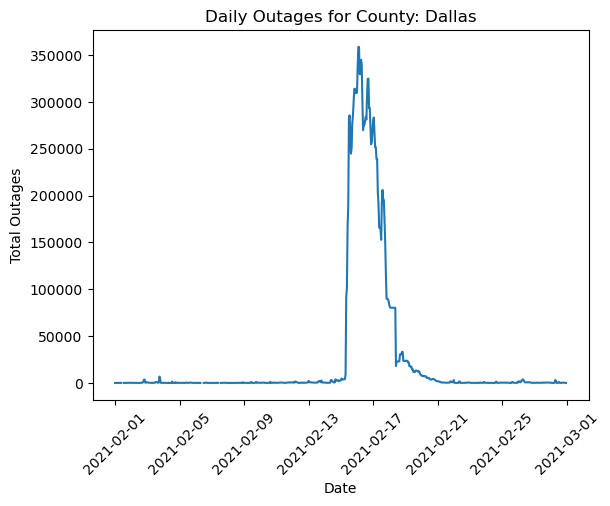

In [353]:
import matplotlib.pyplot as plt

# Plot the daily outages
plt.plot(hourly_max_outages_san_diego_df1['Date'], hourly_max_outages_san_diego_df1['Highest_Outage'])

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Total Outages')
plt.title('Daily Outages for County: {}'.format(selected_county))

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Display the plot
plt.show()

In [354]:
df2017=pd.read_csv('C:/eaglei_outages/eaglei_outages/eaglei_outages_2017.csv')

In [355]:
# Convert 'run_start_time' column to datetime type (if not already done)
df2017['run_start_time'] = pd.to_datetime(df2017['run_start_time'])

# Example: Filter data for a selected county, specific FIPS code, and year
selected_county4 = 'Miami-Dade'
selected_fips_code4 = 12086
selected_year4 = 2017

filtered_data4 = df2017[(df2017['county'] == selected_county4) &
                        (df2017['fips_code'] == selected_fips_code4) &
                        (df2017['run_start_time'].dt.year == selected_year4)]

# Create a new DataFrame with relevant columns
dfmiam4 = filtered_data4[['county', 'state', 'sum', 'run_start_time']]

In [356]:
# Convert 'run_start_time' column to datetime type (if not already done)
dfmiam4['run_start_time'] = pd.to_datetime(dfmiam4['run_start_time'])

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\1014851328.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmiam4['run_start_time'] = pd.to_datetime(dfmiam4['run_start_time'])


In [358]:
dfmiam4

,county,state,sum,run_start_time
29,Miami-Dade,Florida,545.0,2017-01-01 00:00:00
289,Miami-Dade,Florida,54.0,2017-01-01 00:15:00
549,Miami-Dade,Florida,47.0,2017-01-01 00:30:00
796,Miami-Dade,Florida,47.0,2017-01-01 00:45:00
1035,Miami-Dade,Florida,61.0,2017-01-01 01:00:00
1275,Miami-Dade,Florida,77.0,2017-01-01 01:15:00
1504,Miami-Dade,Florida,79.0,2017-01-01 01:30:00
1731,Miami-Dade,Florida,78.0,2017-01-01 01:45:00
1946,Miami-Dade,Florida,79.0,2017-01-01 02:00:00
2154,Miami-Dade,Florida,61.0,2017-01-01 02:15:00


In [362]:
#highest outage
# Convert run_start_time to datetime format
dfmiam4['run_start_time'] = pd.to_datetime(dfmiam4['run_start_time'])

# Set the run_start_time column as the DataFrame index
dfmiam4.set_index('run_start_time', inplace=True)

C:\Users\halee\AppData\Local\Temp\ipykernel_5976\3050491753.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfmiam4['run_start_time'] = pd.to_datetime(dfmiam4['run_start_time'])


In [363]:
# Resample the data to daily frequency and take the highest outage number for each day
daily_max_outagesdfmiami = dfmiam4.resample('D')['sum'].max()

In [364]:
# Create a new DataFrame from the resampled data
daily_max_outagesdfmiami4= daily_max_outagesdfmiami.to_frame().reset_index()

In [365]:
# Rename the columns for clarity
daily_max_outagesdfmiami4.columns = ['Date', 'Highest_Outage']

In [368]:
daily_max_outagesdfmiami4.fillna(0)

,Date,Highest_Outage
0,2017-01-01,545.0
1,2017-01-02,2671.0
2,2017-01-03,1883.0
3,2017-01-04,3732.0
4,2017-01-05,298.0
5,2017-01-06,447.0
6,2017-01-07,3092.0
7,2017-01-08,3529.0
8,2017-01-09,311.0
9,2017-01-10,4024.0


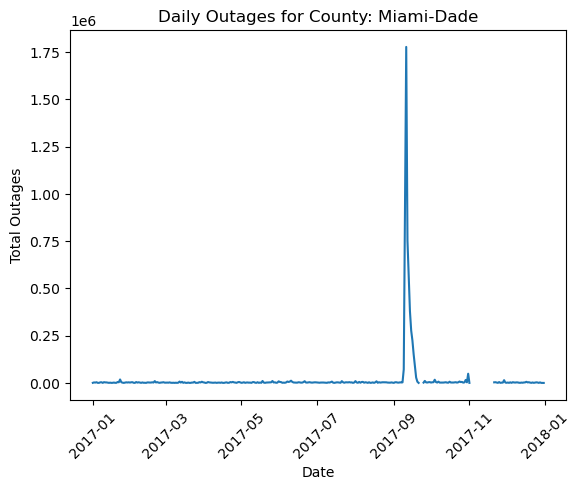

In [369]:
import matplotlib.pyplot as plt

# Plot the daily outages
plt.plot(daily_max_outagesdfmiami4['Date'], daily_max_outagesdfmiami4['Highest_Outage'])

# Set labels and title
plt.xlabel('Date')
plt.ylabel('Total Outages')
plt.title('Daily Outages for County: {}'.format(selected_county4))

# Rotate x-axis labels for better visibility
plt.xticks(rotation=45)

# Display the plot
plt.show()